<img src="https://github.com/AmsterdamUMC/AmsterdamUMCdb/blob/master/img/logo_c4i_square.png?raw=1" alt="Logo C4I" width=128px/>

<img src="https://github.com/AmsterdamUMC/AmsterdamUMCdb/blob/master/img/logo_amds.png?raw=1" alt="Logo AMDS" width=128px/>

# AmsterdamUMCdb with Google BigQuery and Colaboratory
## AmsterdamUMCdb - Freely Accessible ICU Database

AmsterdamUMCdb version 1.5.0 May 2024  
Copyright &copy; 2003-2024 Amsterdam UMC - Amsterdam Medical Data Science

# Introduction
To encourage rapid data exploration and model development, access to AmsterdamUMCdb is also available using Google BigQuery with Google Colaboratory ('Colab') as the main coding environment. This removes the necessity of downloading the AmsterdamUMCdb csv files, setting up a database system and installing a coding environment.

Recently, AmsterdamUMCdb has been [converted](https://github.com/AmsterdamUMC/AMSTEL) to the [Observational Medical Outcomes Partnership Common Data Model version 5.4](https://ohdsi.github.io/CommonDataModel/cdm54.html) (OMOP CDM 5.4) maintained by the [Observational Health Data Sciences and Informatics](https://www.ohdsi.org/) (OHDSI) community. The transition from the original ('classic') AmsterdamUMCdb data format to the OMOP CDM should improve the reusability of both the data and analyses on the current and future version of database by closely adhering to the [FAIR](https://doi.org/10.1038/sdata.2016.18) (Findable, Accessible, Interoperable and Reusable) principles.

This tutorial for using AmsterdamUMCdb on BigQuery was based on the original Google BigQuery tutorial on [Colab](https://colab.research.google.com/notebooks/bigquery.ipynb).

# Running Colab
If not done already, please open Colab with this **getting_started** notebook from the official AmsterdamUMCdb GitHub repository: [![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/AmsterdamUMC/AmsterdamUMCdb/blob/master/bigquery/getting_started.ipynb)

**Important**: when following this tutorial, make sure to follow *all* steps and to run the **code cells** using the **Play** button or by pressing `Ctrl-Enter`

# Before you Begin
Ensure you have a working Google account and verify that the e-mail address used when applying for access has been associated with this account. If you already have a Google account, you can add secondary e-mail addresses [here](https://myaccount.google.com/alternateemail), or alternatively create another Google account using the e-mail address used in the application form.

If you don't have any experience in using Jupyter notebooks and/or Python, it is recommended to familiarize yourself with the [basics](https://colab.research.google.com/notebooks/intro.ipynb).

# Accessing the database
Provided you have signed the end user license agreement, you will have free access to the data from AmsterdamUMCdb through the Google Cloud Platform.

To explore and query the database you need to create a Google Cloud Platform project. For new users, Google offers a free tier of 1 TB (2<sup>40</sup> bytes) per month for queries and in addition \$300 credit for free for use on the Google Cloud Platform (currently: \$6.00 per TB). In the unlikely event, this amount is not sufficient during a datathon or course, please contact us and we will work with you to find a solution.

# Signing up for Google Cloud Platform
- To sign up for the free tier and free credits, please visit the Google Cloud Platform: https://cloud.google.com/.
- Click **Get started for free**.
- Log in with the Google account you used when registering for the datathon.
- In Step 1 of 2: agree to the **Terms of Service** and select **Continue**.
- In Step 2 of 2: You will be required to add some additional information, including a payment method to make sure you are not a robot. Don't worry you won't be charged unless you manually upgrade to a paid account. Depending on your payment provider, you may have an additional step to verify the payment method.
- Finally press **Start my free trial**. You are good to go.



<a name="cell-project-id"></a>
# Retrieving your Google Cloud Project ID
- At the top of the screen, select **My First Project** or [create a new one](https://console.cloud.google.com/projectcreate). Please write down the Project ID in the cell below ("Insert text here") and **Run** the cell to store the value.

In [4]:
# sets *your* project id
PROJECT_ID = "project-b94b02e0-ce53-4cd7-9a8" #@param {type:"string"}

# Sets the default BigQuery dataset for accessing AmsterdamUMCdb

If you have received instructions to use a specific BigQuery instance, change the default settings here. Otherwise use these default values.

In [5]:
# sets default dataset for AmsterdamUMCdb
DATASET_PROJECT_ID = 'amsterdamumcdb' #@param {type:"string"}
DATASET_ID = 'van_gogh_2026_datathon' #@param {type:"string"}
LOCATION = 'eu' #@param {type:"string"}

# Provide your credentials to access the AmsterdamUMCdb dataset on Google BigQuery
Authenticate your credentials with Google Cloud Platform and set your default Google Cloud Project ID as an environment variable for running query jobs.

1. Run the cell. The `Allow this notebook to access your Google credentials?` prompt appears. Select `Allow`.
2. In the `Sign in - Google Accounts` dialog, use the account you registered during the AmsterdamUMCdb application process and select `Allow` again.

In [6]:
import os
from google.colab import auth

# all libraries check this environment variable, so set it:
os.environ["GOOGLE_CLOUD_PROJECT"] = PROJECT_ID

auth.authenticate_user()
print('Authenticated')

Authenticated


# Google BigQuery costs
Since BiqQuery uses a [columnar data structure](https://en.wikipedia.org/wiki/Column-oriented_DBMS), Google will charge you according to the columns selected and the size of the data in those columns. Especially in the data exploration phase, it is prudent to query only the columns you will be actually needing for the analysis.

To help reduce costs, the largest tables that contain device generated data, have been [partitioned](https://cloud.google.com/bigquery/docs/partitioned-tables) by `provider_id`. Unvalidated data (`provider_id IS NULL`) that has been filed up to every minute throughout the ICU stay has been stored in a separate partition. To protect against excessive costs, you are required to specifiy a `WHERE provider_id` clause when accessing these tables.

In addition, the tables have also been [clustered](https://cloud.google.com/bigquery/docs/clustered-tables) on `<domain>_concept_id`, `person_id`, and `<domain>_datetime`. By filtering using WHERE on these columns (in the above order), you can reduce the processing costs as well.

Some examples:

`SELECT * FROM measurements WHERE NOT provider_id IS NULL` will process about 11 GiB data, whereas

`SELECT person_id, visit_occurrence_id, measurement_concept_id, measurement_datetime, value_as_number, unit_concept_id FROM measurement WHERE NOT provider_id IS NULL` will process around 5.5 GiB.

**Important**: `LIMIT` or `WHERE` clauses on columns that have not been used in partitioning or clustering of the data do not have **any** effect on reducing the amount of data processed, and thus charged. These clauses will only limit the number of records returned by the query.

# Available documentation for AmsterdamUMCdb tables.
Since the migration to the OMOP Common Data Model, the official documentation for all tables can be found [here](https://ohdsi.github.io/CommonDataModel/cdm54.html).

# Enable data table display

Colab includes the `google.colab.data_table` package that can be used to display Pandas dataframes as an interactive data table (default limits: `max_rows = 20000`, `max_columns = 20`). This is especially useful when exploring the  tables or dictionary from AmsterdamUMCdb. It can be enabled with:

In [7]:
%load_ext google.colab.data_table
from google.colab.data_table import DataTable

# change default limits:
DataTable.max_columns = 50
DataTable.max_rows = 30000

# Running your first query on AmsterdamUMCdb
BigQuery provides different ways to query the dataset:
- **magics**: the `bigquery_magics` library includes a `%%bigquery` *magic* command which runs a query and either displays the result or saves it to a Pandas DataFrame. The main advantage of this technique is that it improves readability of SQL code by syntax highlighting. Its main limitation: it requires a separate cell for the query, so cannot be combined with other Python code in the same code cell.

Let's query the `person` table using magics.



## Set the default query job configuration for magics

In [8]:
%load_ext bigquery_magics
from bigquery_magics import bigquery_magics
from google.cloud import bigquery

# sets the default query job configuration
def_config = bigquery.job.QueryJobConfig(default_dataset=DATASET_PROJECT_ID + "." + DATASET_ID)
bigquery_magics.context.default_query_job_config = def_config

The bigquery_magics extension is already loaded. To reload it, use:
  %reload_ext bigquery_magics


## Query the `person` table and copy the data to the `persons` Pandas dataframe:

The `person` table contains a record for each patient in AmsterdamUMCdb.

Since this is a relatively small table, it is acceptable to use `SELECT *`.

**Note**: Should an error occur while running the query, please see
the AmsterdamUMCdb BigQuery [Frequently Asked Questions](https://github.com/AmsterdamUMC/AmsterdamUMCdb/wiki/bigquery#faq).

In [46]:
%%bigquery person
SELECT * FROM person

Query is running:   0%|          |

Downloading:   0%|          |

In [52]:
%%bigquery tables_list
SELECT table_name
FROM `amsterdamumcdb.van_gogh_2026_datathon.INFORMATION_SCHEMA.TABLES`
ORDER BY table_name

Query is running:   0%|          |

Downloading:   0%|          |

In [55]:
%%bigquery df_tables
SELECT table_name
FROM `amsterdamumcdb.van_gogh_2026_datathon.INFORMATION_SCHEMA.TABLES`
ORDER BY table_name

Query is running:   0%|          |

Downloading:   0%|          |

In [56]:
df_tables

,table_name
0,concept
1,concept_ancestor
2,concept_class
3,concept_relationship
4,concept_synonym
5,condition_occurrence
6,death
7,device_exposure
8,domain
9,drug_exposure


In [64]:
%%bigquery measurement_df
SELECT *
FROM measurement
LIMIT 10

Query is running:   0%|          |

Downloading:   0%|          |

In [67]:
measurement_df

,person_id,measurement_concept_id,measurement_date,measurement_datetime,measurement_type_concept_id,value_as_number,measurement_source_value,unit_source_value,value_source_value
0,57647,1175625,2010-01-02,2010-01-02 21:50:00+00:00,0,NaN,AF spont ;R UMCA ICU VENTILATOR RESPIRATORY RA...,br/min,None
1,57647,1175625,2010-01-02,2010-01-02 22:50:00+00:00,0,NaN,AF spont ;R UMCA ICU VENTILATOR RESPIRATORY RA...,br/min,None
2,62050,1175625,2017-01-02,2017-01-02 08:52:00+00:00,0,NaN,AF spont ;R UMCA ICU VENTILATOR RESPIRATORY RA...,br/min,None
3,62393,1175625,2017-01-15,2017-01-15 21:38:00+00:00,0,NaN,AF spont ;R UMCA ICU VENTILATOR RESPIRATORY RA...,br/min,None
4,58323,1175625,2017-01-15,2017-01-15 22:23:00+00:00,0,NaN,AF spont ;R UMCA ICU VENTILATOR RESPIRATORY RA...,br/min,None
5,61071,1175625,2000-08-16,2000-08-16 22:05:00+00:00,0,0.0,Ademfrequentie Spontaan (bewaking),bpm,0.0
6,60152,1175625,2001-12-31,2001-12-31 21:44:00+00:00,0,0.0,Ademfrequentie Spontaan (bewaking),bpm,0.0
7,58191,1175625,2002-01-01,2002-01-01 00:00:00+00:00,0,0.0,Ademfrequentie Spontaan (bewaking),bpm,0.0
8,61268,1175625,2002-01-01,2002-01-01 00:02:00+00:00,0,0.0,Ademfrequentie Spontaan (bewaking),bpm,0.0
9,57212,1175625,2002-01-01,2002-01-01 00:02:00+00:00,0,0.0,Ademfrequentie Spontaan (bewaking),bpm,0.0


In [76]:
%%bigquery top_measurements
SELECT
    c.concept_name,
    m.measurement_concept_id,
    COUNT(*) as count_records
FROM
    measurement m
JOIN
    concept c ON m.measurement_concept_id = c.concept_id
GROUP BY
    c.concept_name, m.measurement_concept_id
ORDER BY
    count_records DESC
LIMIT 30

Query is running:   0%|          |

Downloading:   0%|          |

In [77]:
top_measurements

,concept_name,measurement_concept_id,count_records
0,ST deviation,3017453,31932344
1,Invasive Mean blood pressure,21490852,17383466
2,fio2 setting,2000000204,15506049
3,Oxygen saturation in Arterial blood by Pulse o...,40762499,15126034
4,Respiratory rate,3024171,14201192
5,Fluid intake intravascular Measured,3037253,14090784
6,Heart rate by Pulse oximetry,3001376,14081859
7,Carbon dioxide [Partial pressure] in Exhaled g...,3035357,11131232
8,Positive end expiratory pressure setting Venti...,3022875,10425042
9,Heart rate.beat-to-beat by EKG,21490872,9614876


In [71]:
%%bigquery vent_concepts
SELECT
    c.concept_id,
    c.concept_name,
    COUNT(*) as records_found
FROM
    `measurement` m
JOIN
    `concept` c ON m.measurement_concept_id = c.concept_id
WHERE
    LOWER(c.concept_name) LIKE '%peep%'
    OR LOWER(c.concept_name) LIKE '%tidal volume%'
    OR LOWER(c.concept_name) LIKE '%fio2%'
    OR LOWER(c.concept_name) LIKE '%inspiratory pressure%'
GROUP BY
    c.concept_id, c.concept_name
ORDER BY
    records_found DESC
LIMIT 20

Query is running:   0%|          |

Downloading:   0%|          |

In [72]:
vent_concepts

,concept_id,concept_name,records_found
0,2000000204,fio2 setting,15506049
1,36303816,Tidal volume.inspired,8051473
2,3012410,Tidal volume setting Ventilator,5818150
3,21490752,Tidal volume expired Respiratory system airway,5575137
4,2000000211,Inspiratory Pressure Above PEEP,5102095
5,3016226,PEEP Respiratory system,3208912
6,2000000209,Inspiratory Pressure Above PEEP Set,3113240
7,3035822,Intrinsic PEEP Respiratory system,2916879
8,42527140,Total PEEP Respiratory system,1667756
9,3017594,Tidal volume.spontaneous --on ventilator,641549


In [73]:
%%bigquery resolution_check
SELECT
    person_id,
    measurement_datetime,
    value_as_number as FiO2_Setting,
    -- Calculate time difference from the previous row
    TIMESTAMP_DIFF(
        measurement_datetime,
        LAG(measurement_datetime) OVER (PARTITION BY person_id ORDER BY measurement_datetime),
        MINUTE
    ) as minutes_since_last_reading
FROM
    `measurement`
WHERE
    measurement_concept_id = 2000000204 -- FiO2 Setting
    AND value_as_number IS NOT NULL
-- Get data for just one patient to keep it readable
LIMIT 20

Query is running:   0%|          |

Downloading:   0%|          |

In [74]:
resolution_check

,person_id,measurement_datetime,FiO2_Setting,minutes_since_last_reading
0,193,2002-01-01 00:20:00+00:00,39.599998,<NA>
1,193,2002-01-01 00:20:00+00:00,40.000000,0
2,193,2002-01-01 00:31:00+00:00,49.599998,11
3,193,2002-01-01 00:31:00+00:00,50.000000,0
4,193,2002-01-01 01:31:00+00:00,49.400002,60
5,193,2002-01-01 01:31:00+00:00,50.000000,0
6,193,2002-01-01 02:31:00+00:00,49.500000,60
7,193,2002-01-01 02:31:00+00:00,50.000000,0
8,193,2002-01-01 03:31:00+00:00,49.799999,60
9,193,2002-01-01 03:31:00+00:00,50.000000,0


In [78]:
%%bigquery patient_matrix
SELECT
    person_id,
    -- Truncate time to the hour to align different sensors
    TIMESTAMP_TRUNC(measurement_datetime, HOUR) as time_hour,

    -- Hemodynamics
    AVG(CASE WHEN measurement_concept_id = 3001376 THEN value_as_number END) as Heart_Rate,
    AVG(CASE WHEN measurement_concept_id = 21490852 THEN value_as_number END) as Invasive_MAP,
    AVG(CASE WHEN measurement_concept_id = 40762499 THEN value_as_number END) as SpO2,

    -- Ventilation
    AVG(CASE WHEN measurement_concept_id = 2000000204 THEN value_as_number END) as FiO2,
    AVG(CASE WHEN measurement_concept_id = 3022875 THEN value_as_number END) as PEEP,
    AVG(CASE WHEN measurement_concept_id = 36303816 THEN value_as_number END) as Tidal_Volume,
    AVG(CASE WHEN measurement_concept_id = 21490581 THEN value_as_number END) as Compliance

FROM
    `measurement`
WHERE
    person_id = 193 -- Example Patient (Replace with others to test)
    AND measurement_concept_id IN (
        3001376, 21490852, 40762499, -- HR, MAP, SpO2
        2000000204, 3022875, 36303816, 21490581 -- FiO2, PEEP, TV, Compliance
    )
GROUP BY
    person_id, time_hour
ORDER BY
    time_hour

Query is running:   0%|          |

Downloading:   0%|          |

In [79]:
patient_matrix

,person_id,time_hour,Heart_Rate,Invasive_MAP,SpO2,FiO2,PEEP,Tidal_Volume,Compliance
0,193,2002-01-01 00:00:00+00:00,NaN,87.500018,NaN,44.799999,5.0,260.0,NaN
1,193,2002-01-01 01:00:00+00:00,NaN,74.999999,NaN,49.700001,5.0,375.0,NaN
2,193,2002-01-01 02:00:00+00:00,NaN,79.000017,NaN,49.750000,5.0,317.0,NaN
3,193,2002-01-01 03:00:00+00:00,NaN,73.000000,NaN,49.900000,5.0,1373.0,NaN
4,193,2002-01-01 04:00:00+00:00,NaN,73.000000,NaN,49.799999,5.0,550.0,NaN
5,193,2002-01-01 05:00:00+00:00,NaN,83.000021,NaN,49.950001,5.0,982.0,NaN
6,193,2002-01-01 06:00:00+00:00,NaN,77.500007,NaN,49.850000,5.0,764.0,NaN
7,193,2002-01-01 07:00:00+00:00,NaN,74.999999,NaN,NaN,NaN,NaN,NaN
8,193,2002-01-01 08:00:00+00:00,NaN,80.999986,NaN,NaN,NaN,NaN,NaN
9,193,2002-01-01 09:00:00+00:00,NaN,73.000000,NaN,NaN,NaN,NaN,NaN


In [80]:
%%bigquery patient_count
SELECT
    COUNT(DISTINCT person_id) as number_of_unique_patients
FROM
    `person`

Query is running:   0%|          |

Downloading:   0%|          |

In [81]:
patient_count

,number_of_unique_patients
0,65397


In [82]:
%%bigquery counts_comparison
SELECT
    COUNT(DISTINCT p.person_id) as unique_patients,
    COUNT(DISTINCT v.visit_occurrence_id) as total_admissions,

    -- Calculate the average number of admissions per patient
    COUNT(DISTINCT v.visit_occurrence_id) / COUNT(DISTINCT p.person_id) as avg_admissions_per_patient
FROM
    `person` p
JOIN
    `visit_occurrence` v ON p.person_id = v.person_id

Query is running:   0%|          |

Downloading:   0%|          |

In [83]:
counts_comparison

,unique_patients,total_admissions,avg_admissions_per_patient
0,65397,79838,1.220821


In [84]:
%%bigquery outcomes_df
SELECT
    COUNT(DISTINCT v.visit_occurrence_id) as total_admissions,

    -- 1. Calculate Mortality Rate
    -- We check if there is a matching record in the DEATH table
    COUNT(DISTINCT d.person_id) as total_deaths,
    ROUND(COUNT(DISTINCT d.person_id) / COUNT(DISTINCT p.person_id) * 100, 2) as mortality_rate_percent,

    -- 2. Calculate Length of Stay (LOS) in Days
    ROUND(AVG(TIMESTAMP_DIFF(v.visit_end_datetime, v.visit_start_datetime, HOUR) / 24.0), 1) as avg_los_days,

    -- Median is often better for LOS because of long-stay outliers
    -- BigQuery APPROX_QUANTILES is the fastest way to get median
    ROUND(APPROX_QUANTILES(TIMESTAMP_DIFF(v.visit_end_datetime, v.visit_start_datetime, HOUR) / 24.0, 100)[OFFSET(50)], 1) as median_los_days

FROM
    `visit_occurrence` v
JOIN
    `person` p ON v.person_id = p.person_id
LEFT JOIN
    `death` d ON p.person_id = d.person_id

Query is running:   0%|          |

Downloading:   0%|          |

In [85]:
outcomes_df

,total_admissions,total_deaths,mortality_rate_percent,avg_los_days,median_los_days
0,79838,11413,17.45,4.2,1.5


In [86]:
%%bigquery demographics_df
SELECT
    p.person_id,
    v.visit_occurrence_id,

    -- 1. Get Gender Name (Join with Concept table)
    c.concept_name as gender,

    -- 2. Calculate Age at Admission
    -- (Visit Year - Birth Year)
    (EXTRACT(YEAR FROM v.visit_start_date) - p.year_of_birth) as age_at_admission,

    -- 3. Mortality Status (for grouping)
    CASE WHEN d.death_date IS NOT NULL THEN 'Expired' ELSE 'Survived' END as outcome

FROM
    `person` p
JOIN
    `visit_occurrence` v ON p.person_id = v.person_id
LEFT JOIN
    `concept` c ON p.gender_concept_id = c.concept_id
LEFT JOIN
    `death` d ON p.person_id = d.person_id
WHERE
    -- Filter out data errors where age might be negative or impossible
    (EXTRACT(YEAR FROM v.visit_start_date) - p.year_of_birth) BETWEEN 18 AND 110

Query is running:   0%|          |

Downloading:   0%|          |

   person_id  visit_occurrence_id gender  age_at_admission   outcome
0      20969                64791   MALE                85  Survived
1      20969                 4400   MALE                85  Survived
2       9656                61314   MALE                85  Survived
3      38388                69305   MALE                85  Survived
4      39876                69799   MALE                85   Expired


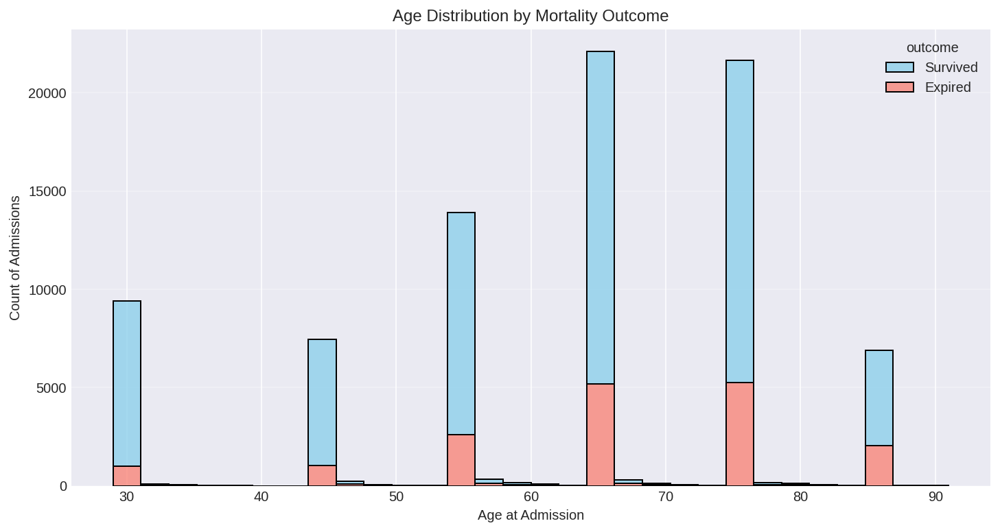


Summary Statistics:
            count       mean        std   min   25%   50%   75%   max
outcome                                                              
Expired   17838.0  65.493889  13.875783  29.0  55.0  65.0  75.0  91.0
Survived  65555.0  60.587324  16.183525  29.0  55.0  65.0  75.0  91.0


In [88]:
import matplotlib.pyplot as plt
import seaborn as sns

# Check the first few rows
print(demographics_df.head())

# Set up the plot
plt.figure(figsize=(12, 6))

# Create a histogram of Age, colored by Outcome (Survived vs Expired)
sns.histplot(
    data=demographics_df,
    x='age_at_admission',
    hue='outcome',
    multiple='stack',
    bins=30,
    palette={'Survived': 'skyblue', 'Expired': 'salmon'}
)

plt.title('Age Distribution by Mortality Outcome')
plt.xlabel('Age at Admission')
plt.ylabel('Count of Admissions')
plt.grid(axis='y', alpha=0.3)
plt.show()

# Print summary stats
print("\nSummary Statistics:")
print(demographics_df.groupby('outcome')['age_at_admission'].describe())

In [89]:
# Assuming your dataframe is named 'demographics_df'

# 1. Check Gender Balance
print("--- Gender Distribution ---")
print(demographics_df['gender'].value_counts(normalize=True) * 100)

# 2. Check Mortality Rate
print("\n--- Mortality Rate ---")
print(demographics_df['outcome'].value_counts(normalize=True) * 100)

# 3. Check Age Statistics by Outcome
print("\n--- Age Stats by Outcome ---")
print(demographics_df.groupby('outcome')['age_at_admission'].describe())

--- Gender Distribution ---
gender
MALE      64.251208
FEMALE    35.748792
Name: proportion, dtype: float64

--- Mortality Rate ---
outcome
Survived    78.609715
Expired     21.390285
Name: proportion, dtype: float64

--- Age Stats by Outcome ---
            count       mean        std   min   25%   50%   75%   max
outcome                                                              
Expired   17838.0  65.493889  13.875783  29.0  55.0  65.0  75.0  91.0
Survived  65555.0  60.587324  16.183525  29.0  55.0  65.0  75.0  91.0


In [90]:
%%bigquery final_dataset
WITH demographics AS (
    SELECT
        p.person_id,
        v.visit_occurrence_id,
        c.concept_name as gender,
        (EXTRACT(YEAR FROM v.visit_start_date) - p.year_of_birth) as age,
        CASE WHEN d.death_date IS NOT NULL THEN 1 ELSE 0 END as mortality_label
    FROM `person` p
    JOIN `visit_occurrence` v ON p.person_id = v.person_id
    LEFT JOIN `concept` c ON p.gender_concept_id = c.concept_id
    LEFT JOIN `death` d ON p.person_id = d.person_id
),
vitals AS (
    SELECT
        person_id,
        -- Calculate MEAN values for the entire stay (Feature Engineering)
        AVG(CASE WHEN measurement_concept_id = 3001376 THEN value_as_number END) as avg_heart_rate,
        AVG(CASE WHEN measurement_concept_id = 21490852 THEN value_as_number END) as avg_map, -- Mean Arterial Pressure
        AVG(CASE WHEN measurement_concept_id = 40762499 THEN value_as_number END) as avg_spo2,
        AVG(CASE WHEN measurement_concept_id = 2000000204 THEN value_as_number END) as avg_fio2,
        MAX(CASE WHEN measurement_concept_id = 3024171 THEN value_as_number END) as max_resp_rate
    FROM `measurement`
    WHERE measurement_concept_id IN (3001376, 21490852, 40762499, 2000000204, 3024171)
    GROUP BY person_id
)
SELECT
    d.person_id,
    d.gender,
    d.age,
    v.avg_heart_rate,
    v.avg_map,
    v.avg_spo2,
    v.avg_fio2,
    v.max_resp_rate,
    d.mortality_label
FROM demographics d
JOIN vitals v ON d.person_id = v.person_id
WHERE d.age BETWEEN 18 AND 100

Query is running:   0%|          |

Downloading:   0%|          |

In [91]:
final_dataset

,person_id,gender,age,avg_heart_rate,avg_map,avg_spo2,avg_fio2,max_resp_rate,mortality_label
0,2272,None,85,NaN,67.971430,NaN,NaN,NaN,0
1,28470,None,65,NaN,71.444447,NaN,51.945000,20.299999,0
2,4709,None,85,NaN,101.428577,NaN,40.445833,18.400000,0
3,11375,None,75,NaN,74.833329,NaN,43.743750,24.200001,0
4,53890,None,65,NaN,75.400014,NaN,94.390909,25.000000,1
...,...,...,...,...,...,...,...,...,...
56583,53945,MALE,29,64.590909,92.733333,98.138889,33.750000,25.000000,0
56584,64983,MALE,29,91.500000,NaN,99.748512,75.437500,39.000000,0
56585,29060,MALE,29,80.888889,NaN,95.800000,NaN,31.000000,0
56586,10616,MALE,29,58.698706,61.642012,98.858355,55.011905,25.000000,0


In [92]:
# Check the first 5 rows of your ML-ready dataset
print(final_dataset.head())

# Check how many patients have missing vitals (NaN)
print(final_dataset.isnull().sum())

   person_id gender  age  avg_heart_rate     avg_map  avg_spo2   avg_fio2  \
0       2272   None   85             NaN   67.971430       NaN        NaN   
1      28470   None   65             NaN   71.444447       NaN  51.945000   
2       4709   None   85             NaN  101.428577       NaN  40.445833   
3      11375   None   75             NaN   74.833329       NaN  43.743750   
4      53890   None   65             NaN   75.400014       NaN  94.390909   

   max_resp_rate  mortality_label  
0            NaN                0  
1      20.299999                0  
2      18.400000                0  
3      24.200001                0  
4      25.000000                1  
person_id              0
gender               443
age                    0
avg_heart_rate     23670
avg_map             1979
avg_spo2           23725
avg_fio2            9224
max_resp_rate       7102
mortality_label        0
dtype: int64


In [93]:
%%bigquery night_shift_df
WITH admissions AS (
    SELECT
        person_id,
        visit_occurrence_id,
        visit_start_datetime
    FROM `visit_occurrence`
    -- Filter for stays > 24 hours
    WHERE TIMESTAMP_DIFF(visit_end_datetime, visit_start_datetime, HOUR) > 24
),

hourly_data AS (
    SELECT
        m.person_id,
        m.measurement_datetime,
        EXTRACT(HOUR FROM m.measurement_datetime) as hour_of_day,
        -- Calculate "Day Number" relative to admission (Day 1, Day 2, etc.)
        TIMESTAMP_DIFF(m.measurement_datetime, a.visit_start_datetime, DAY) as day_number,

        -- 1. FiO2 (Respiratory)
        CASE WHEN m.measurement_concept_id = 2000000204 THEN m.value_as_number END as fio2,

        -- 2. Mean Arterial Pressure (Hemodynamic)
        CASE WHEN m.measurement_concept_id = 21490852 THEN m.value_as_number END as map,

        -- 3. Heart Rate
        CASE WHEN m.measurement_concept_id = 3001376 THEN m.value_as_number END as hr,

        -- 4. pH (Metabolic/Respiratory)
        CASE WHEN m.measurement_concept_id = 3024561 THEN m.value_as_number END as ph

    FROM `measurement` m
    JOIN admissions a ON m.person_id = a.person_id
    WHERE m.measurement_concept_id IN (2000000204, 21490852, 3001376, 3024561)
),

aggregated_shifts AS (
    SELECT
        person_id,
        day_number,

        -- === INPUT FEATURES (Day Shift: 08:00 - 22:00) ===
        AVG(CASE WHEN hour_of_day BETWEEN 8 AND 21 THEN fio2 END) as day_fio2_avg,
        MAX(CASE WHEN hour_of_day BETWEEN 8 AND 21 THEN fio2 END) as day_fio2_max,
        AVG(CASE WHEN hour_of_day BETWEEN 8 AND 21 THEN map END) as day_map_avg,
        MIN(CASE WHEN hour_of_day BETWEEN 8 AND 21 THEN map END) as day_map_min,
        AVG(CASE WHEN hour_of_day BETWEEN 8 AND 21 THEN hr END) as day_hr_avg,
        MIN(CASE WHEN hour_of_day BETWEEN 8 AND 21 THEN ph END) as day_ph_min,

        -- === TARGETS (Night Shift: 22:00 - 08:00 Next Day) ===
        MAX(CASE WHEN hour_of_day >= 22 OR hour_of_day < 8 THEN fio2 END) as night_fio2_max,
        MIN(CASE WHEN hour_of_day >= 22 OR hour_of_day < 8 THEN map END) as night_map_min,
        MIN(CASE WHEN hour_of_day >= 22 OR hour_of_day < 8 THEN ph END) as night_ph_min

    FROM hourly_data
    GROUP BY person_id, day_number
)

SELECT
    *,
    -- === DEFINE THE EVENTS (The Labels) ===

    -- Event 1: Respiratory Deterioration (FiO2 increases by >10% at night)
    CASE
        WHEN night_fio2_max > (day_fio2_max + 10) THEN 1
        ELSE 0
    END as target_fio2_increase,

    -- Event 2: Hemodynamic Instability (MAP drops < 60 at night when it was normal during day)
    CASE
        WHEN night_map_min < 60 AND day_map_min >= 65 THEN 1
        ELSE 0
    END as target_hypotension,

    -- Event 3: Acidosis (pH drops < 7.30 at night)
    CASE
        WHEN night_ph_min < 7.30 AND day_ph_min >= 7.35 THEN 1
        ELSE 0
    END as target_acidosis

FROM aggregated_shifts
-- Remove rows where we don't have enough data to calculate targets
WHERE day_fio2_avg IS NOT NULL
  AND night_fio2_max IS NOT NULL
ORDER BY person_id, day_number

Query is running:   0%|          |

Downloading:   0%|          |

In [94]:
night_shift_df

,person_id,day_number,day_fio2_avg,day_fio2_max,day_map_avg,day_map_min,day_hr_avg,day_ph_min,night_fio2_max,night_map_min,night_ph_min,target_fio2_increase,target_hypotension,target_acidosis
0,1,0,40.177273,40.799999,83.307681,65.999998,NaN,23.999999,50.000000,72.000001,26.999999,0,0,0
1,1,1,40.292308,41.000000,90.727268,84.999991,NaN,21.999999,41.000000,75.999998,NaN,0,0,0
2,1,2,40.281818,40.799999,83.214290,53.000001,NaN,18.999998,41.000000,76.999982,17.000000,0,0,0
3,1,3,40.126923,40.599998,89.428565,80.000002,NaN,17.999998,40.500000,73.000000,NaN,0,0,0
4,1,4,40.064285,40.599998,78.818178,24.999998,NaN,17.999998,40.299999,75.999998,NaN,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
162171,65396,1,43.117647,100.000000,72.071429,63.000000,59.178571,NaN,100.000000,67.000000,NaN,0,0,0
162172,65396,2,42.444444,64.000000,72.857143,59.000000,63.464286,NaN,100.000000,69.000000,NaN,1,0,0
162173,65396,3,34.312500,41.000000,78.214286,66.000000,64.000000,NaN,39.000000,73.000000,NaN,0,0,0
162174,65396,4,28.000000,34.000000,97.142857,67.000000,79.535714,NaN,34.000000,79.000000,NaN,0,0,0


--- Predicting Nighttime target_fio2_increase ---
              precision    recall  f1-score   support

         0.0       0.91      0.62      0.74     27768
         1.0       0.22      0.64      0.33      4668

    accuracy                           0.62     32436
   macro avg       0.57      0.63      0.53     32436
weighted avg       0.81      0.62      0.68     32436



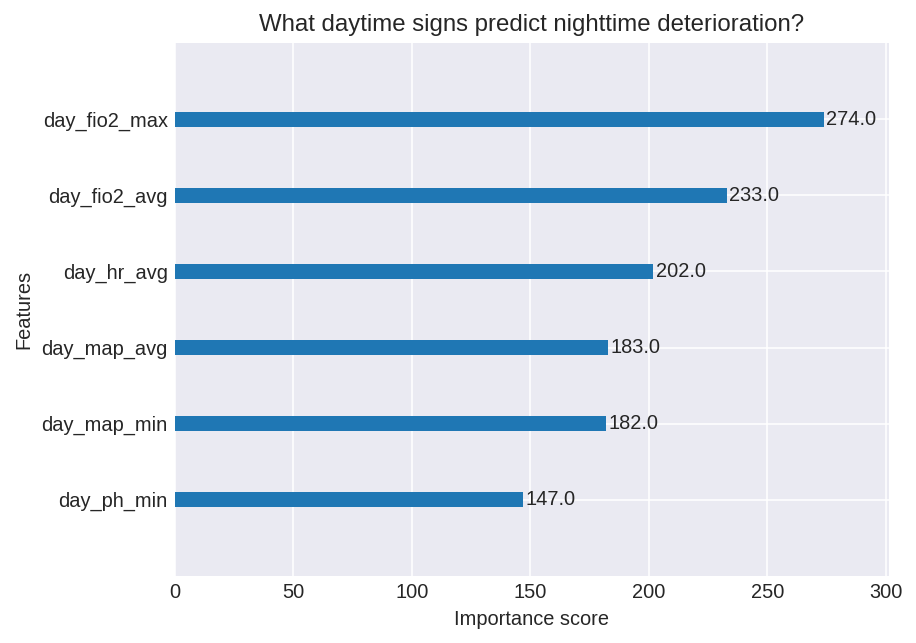

In [95]:
import pandas as pd
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix

# 1. Prepare Data
# Drop identifiers and targets from input features (X)
features = ['day_fio2_avg', 'day_fio2_max', 'day_map_avg', 'day_map_min', 'day_hr_avg', 'day_ph_min']
target = 'target_fio2_increase' # Let's predict Respiratory Deterioration first

X = night_shift_df[features].fillna(0) # Simple imputation for tutorial
y = night_shift_df[target]

# 2. Split Data
# CRITICAL: In a real study, split by person_id, not random shuffle, to prevent leakage.
# For this quick demo, standard split is shown.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 3. Train Model (XGBoost)
model = xgb.XGBClassifier(
    n_estimators=100,
    max_depth=4,
    learning_rate=0.1,
    scale_pos_weight=5 # Handle class imbalance (events are rare)
)
model.fit(X_train, y_train)

# 4. Evaluate
y_pred = model.predict(X_test)

print(f"--- Predicting Nighttime {target} ---")
print(classification_report(y_test, y_pred))

# 5. Feature Importance
# What daytime signal best predicts the nighttime crash?
import matplotlib.pyplot as plt
xgb.plot_importance(model)
plt.title("What daytime signs predict nighttime deterioration?")
plt.show()

In [96]:
%%bigquery improved_night_df
WITH admissions AS (
    SELECT person_id, visit_start_datetime
    FROM `visit_occurrence`
    WHERE TIMESTAMP_DIFF(visit_end_datetime, visit_start_datetime, HOUR) > 24
),

hourly_data AS (
    SELECT
        m.person_id,
        EXTRACT(HOUR FROM m.measurement_datetime) as hour_of_day,
        TIMESTAMP_DIFF(m.measurement_datetime, a.visit_start_datetime, DAY) as day_number,

        -- FiO2 (Respiratory)
        AVG(CASE WHEN m.measurement_concept_id = 2000000204 THEN m.value_as_number END) as fio2,
        -- Glucose (Metabolic - Option 2) - ID 3000483 is Glucose in Serum/Plasma
        AVG(CASE WHEN m.measurement_concept_id IN (3000483, 3013386) THEN m.value_as_number END) as glucose

    FROM `measurement` m
    JOIN admissions a ON m.person_id = a.person_id
    WHERE m.measurement_concept_id IN (2000000204, 3000483, 3013386)
    GROUP BY 1, 2, 3
),

features AS (
    SELECT
        person_id,
        day_number,

        -- 1. MORNING BASELINE (08:00 - 12:00)
        AVG(CASE WHEN hour_of_day BETWEEN 8 AND 12 THEN fio2 END) as morning_fio2,
        AVG(CASE WHEN hour_of_day BETWEEN 8 AND 12 THEN glucose END) as morning_glucose,

        -- 2. EVENING TREND (18:00 - 22:00) - The "Pre-Night" status
        AVG(CASE WHEN hour_of_day BETWEEN 18 AND 21 THEN fio2 END) as evening_fio2,
        AVG(CASE WHEN hour_of_day BETWEEN 18 AND 21 THEN glucose END) as evening_glucose,

        -- 3. NIGHT TARGET (22:00 - 08:00 Next Day)
        MAX(CASE WHEN hour_of_day >= 22 OR hour_of_day < 8 THEN fio2 END) as night_fio2_max,
        MAX(CASE WHEN hour_of_day >= 22 OR hour_of_day < 8 THEN glucose END) as night_glucose_max

    FROM hourly_data
    GROUP BY person_id, day_number
)

SELECT
    *,
    -- Calculate the "Drift" (Evening - Morning)
    (evening_fio2 - morning_fio2) as fio2_drift,
    (evening_glucose - morning_glucose) as glucose_drift,

    -- TARGET: Did FiO2 spike at night?
    CASE WHEN night_fio2_max > (evening_fio2 + 10) THEN 1 ELSE 0 END as target_deterioration
FROM features
WHERE evening_fio2 IS NOT NULL AND morning_fio2 IS NOT NULL

Query is running:   0%|          |

Downloading:   0%|          |

In [97]:
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, precision_recall_curve
import numpy as np

# 1. Prepare Data
# We now use the "Drift" features which are much more predictive
features = ['morning_fio2', 'evening_fio2', 'fio2_drift', 'morning_glucose', 'evening_glucose', 'glucose_drift']
target = 'target_deterioration'

X = improved_night_df[features].fillna(0)
y = improved_night_df[target]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 2. Train with slightly less aggressive weighting
# Reduced scale_pos_weight from 5 to 3 to improve Precision
model = xgb.XGBClassifier(
    n_estimators=150,
    max_depth=5,
    learning_rate=0.05,
    scale_pos_weight=3
)
model.fit(X_train, y_train)

# 3. Evaluate
y_pred = model.predict(X_test)
print("--- Improved Model Results ---")
print(classification_report(y_test, y_pred))

# 4. Find the Optimal Threshold (Advanced Step)
# Instead of default 0.5, let's find the threshold that gives us at least 40% Precision
y_probs = model.predict_proba(X_test)[:, 1]
precision, recall, thresholds = precision_recall_curve(y_test, y_probs)

# Find threshold where Precision is closest to 0.40
idx = np.argmax(precision >= 0.40)
best_threshold = thresholds[idx]

print(f"\nOptimal Decision Threshold: {best_threshold:.2f}")
print(f"At this threshold, Precision is: {precision[idx]:.2f} and Recall is: {recall[idx]:.2f}")

--- Improved Model Results ---
              precision    recall  f1-score   support

         0.0       0.84      0.66      0.74     20138
         1.0       0.43      0.67      0.52      7679

    accuracy                           0.66     27817
   macro avg       0.63      0.66      0.63     27817
weighted avg       0.73      0.66      0.68     27817


Optimal Decision Threshold: 0.46
At this threshold, Precision is: 0.40 and Recall is: 0.73


In [98]:
%%bigquery final_model_df
WITH admissions AS (
    SELECT person_id, visit_start_datetime
    FROM `visit_occurrence`
    WHERE TIMESTAMP_DIFF(visit_end_datetime, visit_start_datetime, HOUR) > 24
),

hourly_data AS (
    SELECT
        m.person_id,
        EXTRACT(HOUR FROM m.measurement_datetime) as hour_of_day,
        TIMESTAMP_DIFF(m.measurement_datetime, a.visit_start_datetime, DAY) as day_number,

        -- 1. Respiratory (FiO2) - ID 2000000204
        AVG(CASE WHEN m.measurement_concept_id = 2000000204 THEN m.value_as_number END) as fio2,

        -- 2. Metabolic (Glucose) - ID 3000483
        AVG(CASE WHEN m.measurement_concept_id IN (3000483, 3013386) THEN m.value_as_number END) as glucose,

        -- 3. Hemodynamic (MAP) - ID 21490852
        -- A drop in MAP usually precedes a vasopressor increase
        AVG(CASE WHEN m.measurement_concept_id = 21490852 THEN m.value_as_number END) as map,

        -- 4. Acid-Base (pH) - ID 3024561
        AVG(CASE WHEN m.measurement_concept_id = 3024561 THEN m.value_as_number END) as ph

    FROM `measurement` m
    JOIN admissions a ON m.person_id = a.person_id
    WHERE m.measurement_concept_id IN (2000000204, 3000483, 3013386, 21490852, 3024561)
    GROUP BY 1, 2, 3
),

features AS (
    SELECT
        person_id,
        day_number,

        -- === MORNING BASELINE (08:00 - 12:00) ===
        AVG(CASE WHEN hour_of_day BETWEEN 8 AND 12 THEN fio2 END) as morn_fio2,
        AVG(CASE WHEN hour_of_day BETWEEN 8 AND 12 THEN glucose END) as morn_gluc,
        AVG(CASE WHEN hour_of_day BETWEEN 8 AND 12 THEN map END) as morn_map,
        AVG(CASE WHEN hour_of_day BETWEEN 8 AND 12 THEN ph END) as morn_ph,

        -- === EVENING TREND (18:00 - 22:00) ===
        AVG(CASE WHEN hour_of_day BETWEEN 18 AND 21 THEN fio2 END) as eve_fio2,
        AVG(CASE WHEN hour_of_day BETWEEN 18 AND 21 THEN glucose END) as eve_gluc,
        AVG(CASE WHEN hour_of_day BETWEEN 18 AND 21 THEN map END) as eve_map,
        AVG(CASE WHEN hour_of_day BETWEEN 18 AND 21 THEN ph END) as eve_ph,

        -- === NIGHT TARGETS (22:00 - 08:00 Next Day) ===
        MAX(CASE WHEN hour_of_day >= 22 OR hour_of_day < 8 THEN fio2 END) as night_fio2_max,
        MIN(CASE WHEN hour_of_day >= 22 OR hour_of_day < 8 THEN glucose END) as night_gluc_min,
        MIN(CASE WHEN hour_of_day >= 22 OR hour_of_day < 8 THEN map END) as night_map_min,
        MIN(CASE WHEN hour_of_day >= 22 OR hour_of_day < 8 THEN ph END) as night_ph_min

    FROM hourly_data
    GROUP BY person_id, day_number
)

SELECT
    *,
    -- Calculate Drifts (Evening - Morning)
    (eve_fio2 - morn_fio2) as drift_fio2,
    (eve_gluc - morn_gluc) as drift_gluc,
    (eve_map - morn_map) as drift_map,
    (eve_ph - morn_ph) as drift_ph,

    -- === COMPOSITE TARGET ===
    -- Did ANY of the 4 systems fail at night?
    CASE
        WHEN night_fio2_max > (eve_fio2 + 10) THEN 1  -- Respiratory Failure
        WHEN night_map_min < 60 AND eve_map >= 65 THEN 1 -- Hemodynamic Crash
        WHEN night_gluc_min < 3.5 THEN 1 -- Hypoglycemia
        WHEN night_ph_min < 7.25 AND eve_ph >= 7.30 THEN 1 -- Acidosis
        ELSE 0
    END as target_any_failure

FROM features
-- Ensure we have at least evening data to make a prediction
WHERE eve_fio2 IS NOT NULL AND eve_map IS NOT NULL

Query is running:   0%|          |

Downloading:   0%|          |

--- Unified Nighttime Deterioration Model ---
              precision    recall  f1-score   support

         0.0       0.82      0.37      0.51     18408
         1.0       0.45      0.87      0.60     11096

    accuracy                           0.56     29504
   macro avg       0.64      0.62      0.55     29504
weighted avg       0.68      0.56      0.54     29504



<Figure size 1440x1152 with 0 Axes>

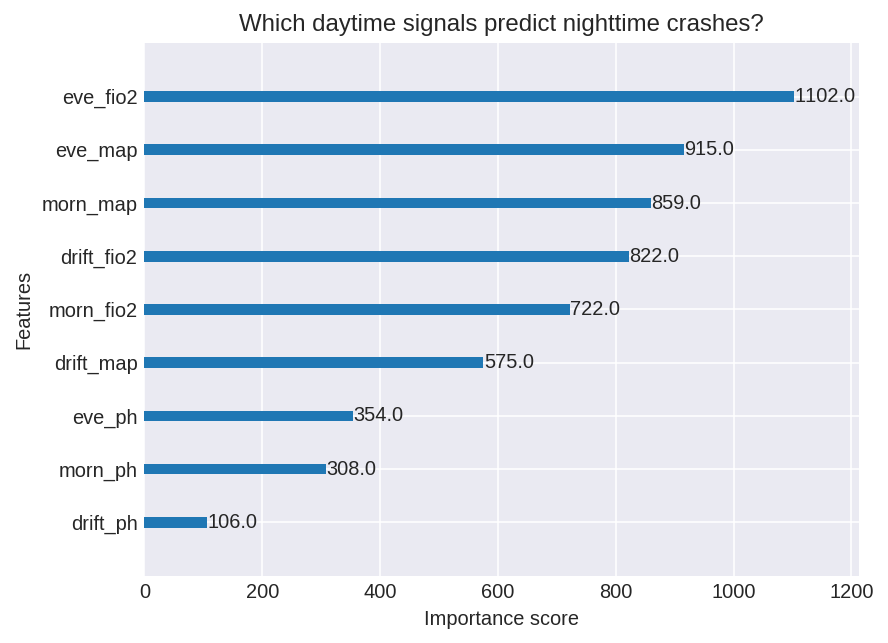

In [99]:
import xgboost as xgb
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

# 1. Prepare Data
features = [
    'morn_fio2', 'eve_fio2', 'drift_fio2',
    'morn_map', 'eve_map', 'drift_map',
    'morn_gluc', 'eve_gluc', 'drift_gluc',
    'morn_ph', 'eve_ph', 'drift_ph'
]
target = 'target_any_failure'

# Handle missing values (XGBoost handles NaNs, but filling with 0 or mean is safer for demo)
X = final_model_df[features].fillna(0)
y = final_model_df[target]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 2. Train Model
model = xgb.XGBClassifier(
    n_estimators=200,
    max_depth=5,
    learning_rate=0.05,
    scale_pos_weight=3 # Balanced weight
)
model.fit(X_train, y_train)

# 3. Evaluate
y_pred = model.predict(X_test)
print("--- Unified Nighttime Deterioration Model ---")
print(classification_report(y_test, y_pred))

# 4. Feature Importance (The Clinical Insight)
plt.figure(figsize=(10, 8))
xgb.plot_importance(model, max_num_features=10, importance_type='weight')
plt.title("Which daytime signals predict nighttime crashes?")
plt.show()

--- Re-Tuned Model Results ---
              precision    recall  f1-score   support

         0.0       0.70      0.87      0.78     18408
         1.0       0.64      0.39      0.48     11096

    accuracy                           0.69     29504
   macro avg       0.67      0.63      0.63     29504
weighted avg       0.68      0.69      0.67     29504



<Figure size 1728x1152 with 0 Axes>

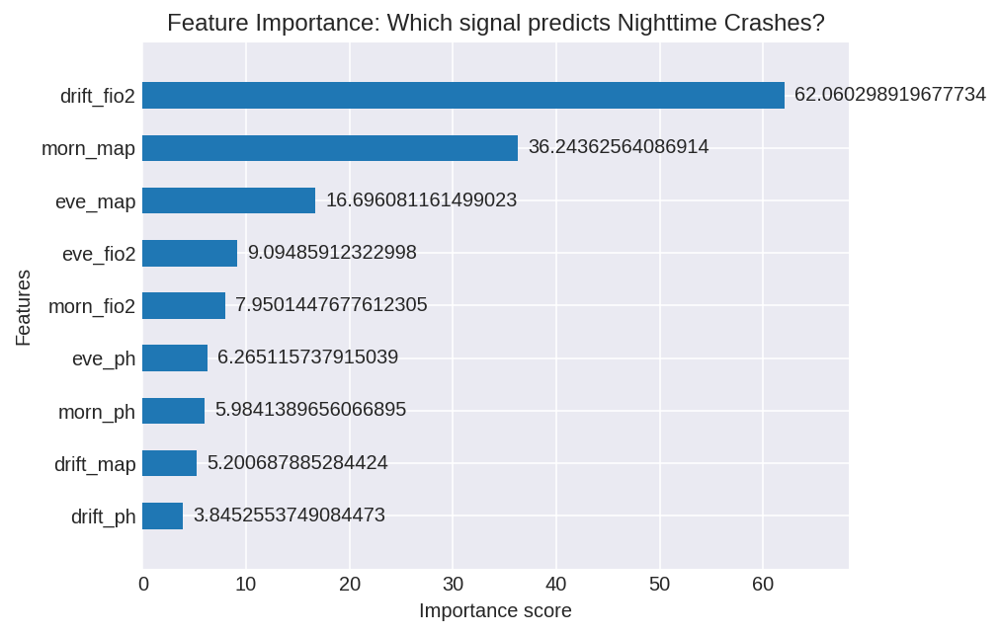

In [100]:
import xgboost as xgb
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix

# 1. Prepare Data
features = [
    'morn_fio2', 'eve_fio2', 'drift_fio2',   # Respiratory
    'morn_map', 'eve_map', 'drift_map',      # Hemodynamic
    'morn_gluc', 'eve_gluc', 'drift_gluc',   # Metabolic
    'morn_ph', 'eve_ph', 'drift_ph'          # Acid-Base
]
target = 'target_any_failure'

# CRITICAL CHANGE: Do NOT fillna(0). XGBoost handles NaNs natively.
X = final_model_df[features]
y = final_model_df[target]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 2. Train Model (Balanced Mode)
# Removed scale_pos_weight because your classes are naturally balanced (11k vs 18k)
model = xgb.XGBClassifier(
    n_estimators=200,
    max_depth=6,          # Slightly deeper to find interactions
    learning_rate=0.05,
    eval_metric='logloss'
)
model.fit(X_train, y_train)

# 3. Evaluate
y_pred = model.predict(X_test)
print("--- Re-Tuned Model Results ---")
print(classification_report(y_test, y_pred))

# 4. The Answer to Your Research Question
# Which variable is the strongest predictor?
plt.figure(figsize=(12, 8))
xgb.plot_importance(model, max_num_features=12, importance_type='gain', height=0.5)
plt.title("Feature Importance: Which signal predicts Nighttime Crashes?")
plt.show()

/usr/local/lib/python3.12/dist-packages/numpy/lib/_nanfunctions_impl.py:1424: RuntimeWarning: All-NaN slice encountered
  return _nanquantile_unchecked(


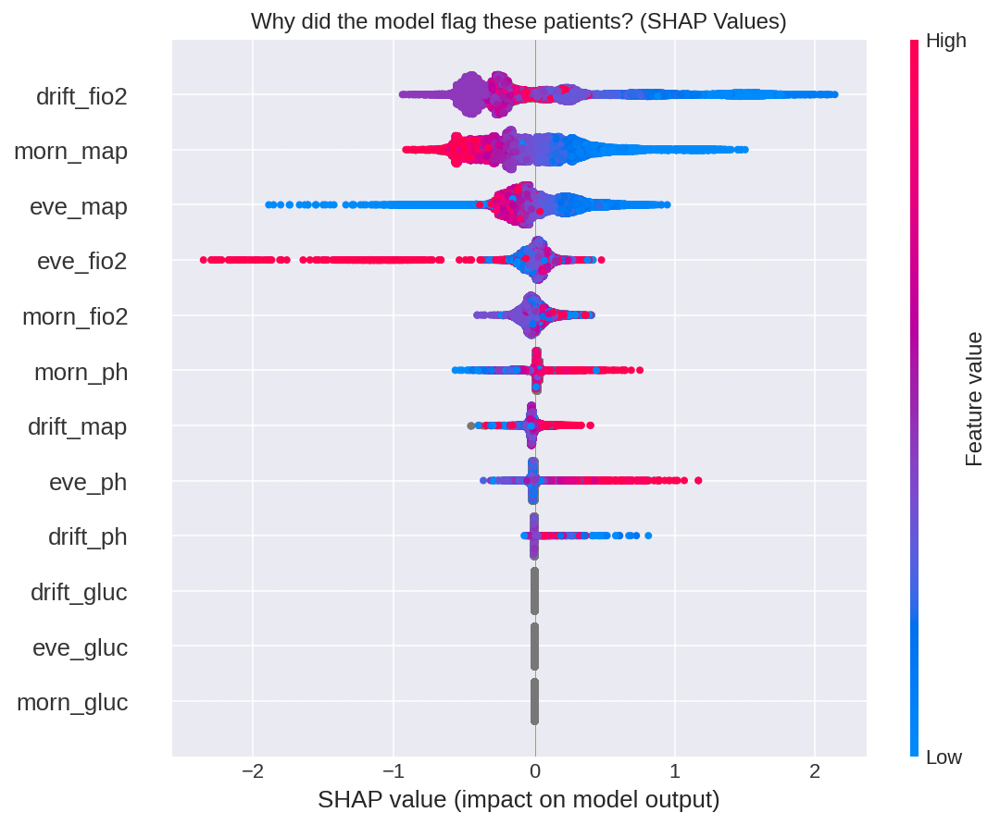

In [101]:
import shap

# 1. Initialize the Explainer
# We use the model you just trained
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_test)

# 2. Create the Summary Plot
plt.figure(figsize=(12, 8))
plt.title("Why did the model flag these patients? (SHAP Values)")
shap.summary_plot(shap_values, X_test, show=False)
plt.show()

In [103]:
%%bigquery attention_df
SELECT
    v.visit_occurrence_id,
    -- Check if patient died
    MAX(CASE WHEN d.death_date IS NOT NULL THEN 1 ELSE 0 END) as died,

    -- Calculate Length of Stay in Hours
    TIMESTAMP_DIFF(v.visit_end_datetime, v.visit_start_datetime, HOUR) as los_hours,

    -- Count total measurements
    COUNT(m.measurement_concept_id) as total_measurements,

    -- Calculate "Intensity" (Measurements per Hour)
    SAFE_DIVIDE(COUNT(m.measurement_concept_id), TIMESTAMP_DIFF(v.visit_end_datetime, v.visit_start_datetime, HOUR)) as measurements_per_hour

FROM `visit_occurrence` v
-- JOIN FIX: Link by Person ID, then filter by Date
JOIN `measurement` m
    ON v.person_id = m.person_id
LEFT JOIN `person` p
    ON v.person_id = p.person_id
LEFT JOIN `death` d
    ON p.person_id = d.person_id

WHERE
    -- Only count measurements that happened DURING the visit
    m.measurement_datetime BETWEEN v.visit_start_datetime AND v.visit_end_datetime
    -- Filter for stays > 24 hours to remove minor checkups
    AND TIMESTAMP_DIFF(v.visit_end_datetime, v.visit_start_datetime, HOUR) > 24

GROUP BY
    v.visit_occurrence_id, v.visit_end_datetime, v.visit_start_datetime
HAVING
    los_hours > 0
LIMIT 5000 -- Limit to 5000 visits for faster plotting

Query is running:   0%|          |

Downloading:   0%|          |

In [104]:
attention_df

,visit_occurrence_id,died,los_hours,total_measurements,measurements_per_hour
0,73947,0,112,3914,34.946429
1,52890,0,38,910,23.947368
2,12649,0,97,10284,106.020619
3,9507,0,233,16303,69.969957
4,70774,1,68,1550,22.794118
...,...,...,...,...,...
4995,49508,0,144,3434,23.847222
4996,5583,0,25,570,22.800000
4997,52211,1,96,5648,58.833333
4998,72856,1,40,494,12.350000


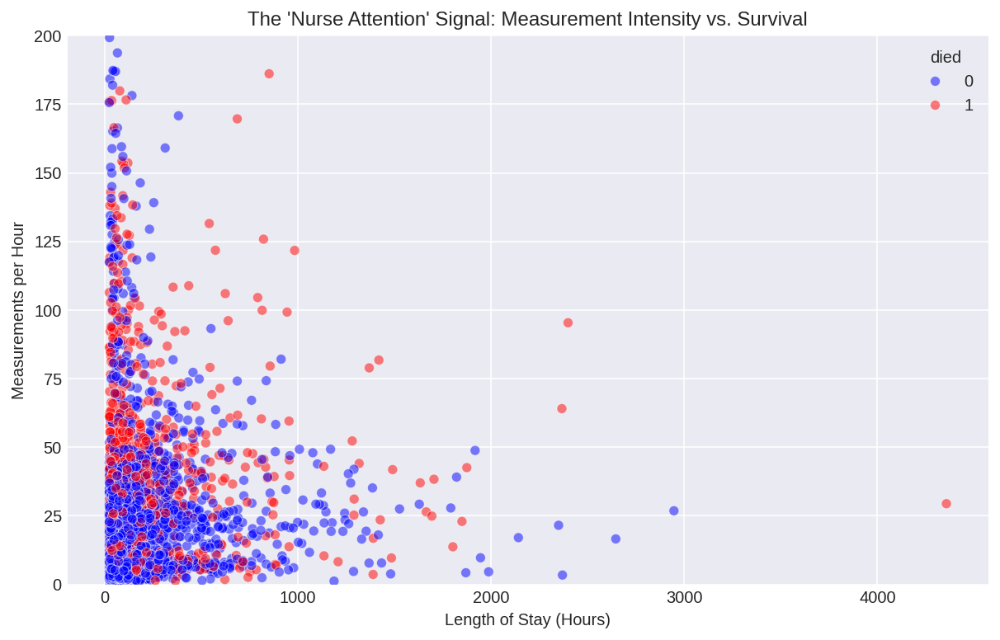

In [106]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
sns.scatterplot(
    data=attention_df,
    x='los_hours',
    y='measurements_per_hour',
    hue='died',
    alpha=0.5,
    palette={True: 'red', False: 'blue'}
)
plt.title("The 'Nurse Attention' Signal: Measurement Intensity vs. Survival")
plt.xlabel("Length of Stay (Hours)")
plt.ylabel("Measurements per Hour")
plt.ylim(0, 200) # Zoom in to relevant range
plt.show()

In [105]:
%%bigquery phenotype_df
SELECT
    v.visit_occurrence_id,
    MAX(CASE WHEN d.death_date IS NOT NULL THEN 1 ELSE 0 END) as died,

    -- Averages of the Top 8 most common vitals in first 24h
    AVG(CASE WHEN m.measurement_concept_id = 3001376 THEN m.value_as_number END) as HR,
    AVG(CASE WHEN m.measurement_concept_id = 21490852 THEN m.value_as_number END) as MAP,
    AVG(CASE WHEN m.measurement_concept_id = 40762499 THEN m.value_as_number END) as SpO2,
    AVG(CASE WHEN m.measurement_concept_id = 2000000204 THEN m.value_as_number END) as FiO2,
    AVG(CASE WHEN m.measurement_concept_id = 3024171 THEN m.value_as_number END) as RespRate,
    AVG(CASE WHEN m.measurement_concept_id = 3020891 THEN m.value_as_number END) as Temp,
    AVG(CASE WHEN m.measurement_concept_id = 3000483 THEN m.value_as_number END) as Glucose,
    AVG(CASE WHEN m.measurement_concept_id = 3024561 THEN m.value_as_number END) as pH

FROM `visit_occurrence` v
-- JOIN FIX: Link by Person ID
JOIN `measurement` m
    ON v.person_id = m.person_id
LEFT JOIN `person` p
    ON v.person_id = p.person_id
LEFT JOIN `death` d
    ON p.person_id = d.person_id

WHERE
    -- Only look at first 24 hours of the admission
    m.measurement_datetime BETWEEN v.visit_start_datetime AND TIMESTAMP_ADD(v.visit_start_datetime, INTERVAL 24 HOUR)

GROUP BY
    v.visit_occurrence_id

Query is running:   0%|          |

Downloading:   0%|          |

In [108]:
phenotype_df

,visit_occurrence_id,died,HR,MAP,SpO2,FiO2,RespRate,Temp,Glucose,pH
0,2192,0,69.979167,83.125000,97.500000,27.888889,10.928571,67.972261,NaN,NaN
1,76043,1,71.989583,77.230303,99.979592,53.040441,13.031915,97.900000,NaN,25.0
2,26093,0,101.583333,69.625000,93.820000,28.464286,24.583333,NaN,NaN,NaN
3,4193,0,90.722222,69.944444,94.333333,49.166667,15.857143,NaN,NaN,30.0
4,16145,1,118.714286,75.857143,95.555556,46.136364,27.826087,NaN,NaN,14.0
...,...,...,...,...,...,...,...,...,...,...
79676,50589,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
79677,33873,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
79678,55536,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
79679,76225,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [115]:
import pandas as pd

# Calculate the percentage of patients missing each specific vital sign
missing_by_column = phenotype_df.isnull().mean() * 100
missing_by_column = missing_by_column.sort_values(ascending=False)

print("--- Percentage of Patients Missing Each Test ---")
print(missing_by_column)

--- Percentage of Patients Missing Each Test ---
Glucose                100.000000
Temp                    78.850667
SpO2                    64.795874
HR                      63.464314
pH                      57.860720
FiO2                    52.464201
RespRate                44.502454
MAP                     39.576562
died                     0.000000
visit_occurrence_id      0.000000
dtype: float64


In [117]:
%%bigquery concept_check
SELECT
    c.concept_name,
    m.measurement_concept_id,
    COUNT(*) as count_records
FROM
    `measurement` m
JOIN
    `concept` c ON m.measurement_concept_id = c.concept_id
WHERE
    -- Search for Glucose or Temperature keywords
    LOWER(c.concept_name) LIKE '%glucose%'
    OR LOWER(c.concept_name) LIKE '%body temperature%'
GROUP BY
    1, 2
ORDER BY
    count_records DESC
LIMIT 10

Query is running:   0%|          |

Downloading:   0%|          |

In [118]:
concept_check

,concept_name,measurement_concept_id,count_records
0,Body temperature,3020891,5264202
1,Glucose [Moles/volume] in Blood,3020491,985230
2,Glucose [Moles/volume] in Arterial blood,3044242,659329
3,Glucose [Moles/volume] in Capillary blood,3040151,99465
4,Glucose [Moles/volume] in Venous blood,3038515,35965
5,Glucose [Moles/volume] in Mixed venous blood,2000000141,6300
6,Glucose [Mass/volume] in Cerebral spinal fluid,3022548,1511
7,Glucose [Moles/volume] in Pleural fluid,3036782,409
8,Glucose [Moles/volume] in drain fluid,2000000452,365
9,Glucose [Moles/volume] in Urine,3005570,254


In [119]:
%%bigquery phenotype_df
SELECT
    v.visit_occurrence_id,
    MAX(CASE WHEN d.death_date IS NOT NULL THEN 1 ELSE 0 END) as died,

    -- 1. HEART RATE (Combining Pulse Ox, EKG, and Palpation)
    -- IDs: PulseOx(3001376), EKG(21490872), Palpation(3003841), Generic(3027018)
    AVG(CASE WHEN m.measurement_concept_id IN (3001376, 21490872, 3003841, 3027018) THEN m.value_as_number END) as HR,

    -- 2. MEAN ARTERIAL PRESSURE (Invasive)
    -- ID: Invasive MAP(21490852)
    AVG(CASE WHEN m.measurement_concept_id = 21490852 THEN m.value_as_number END) as MAP,

    -- 3. SpO2 (Oxygen Saturation)
    -- ID: SpO2(40762499)
    AVG(CASE WHEN m.measurement_concept_id = 40762499 THEN m.value_as_number END) as SpO2,

    -- 4. TEMPERATURE (Confirmed by your output)
    -- ID: Body Temp(3020891)
    AVG(CASE WHEN m.measurement_concept_id = 3020891 THEN m.value_as_number END) as Temp,

    -- 5. GLUCOSE (Combining the IDs you just found)
    -- IDs: Blood(3020491), Arterial(3044242), Capillary(3040151), Venous(3038515)
    AVG(CASE WHEN m.measurement_concept_id IN (3020491, 3044242, 3040151, 3038515) THEN m.value_as_number END) as Glucose

FROM `visit_occurrence` v
JOIN `measurement` m ON v.person_id = m.person_id
LEFT JOIN `person` p ON v.person_id = p.person_id
LEFT JOIN `death` d ON p.person_id = d.person_id
WHERE
    -- Filter for the first 24 hours of the visit
    m.measurement_datetime BETWEEN v.visit_start_datetime AND TIMESTAMP_ADD(v.visit_start_datetime, INTERVAL 24 HOUR)
GROUP BY
    v.visit_occurrence_id

Query is running:   0%|          |

Downloading:   0%|          |

In [120]:
phenotype_df

,visit_occurrence_id,died,HR,MAP,SpO2,Temp,Glucose
0,57912,1,80.474341,77.633333,99.898048,NaN,9.370000
1,68064,0,95.437500,NaN,97.666667,66.55,6.300000
2,24260,0,121.309524,113.071429,95.200000,68.10,7.980000
3,13683,1,112.014493,115.500000,96.730769,68.60,10.511111
4,37805,1,84.586207,85.259259,99.916949,NaN,11.420000
...,...,...,...,...,...,...,...
79676,36480,0,60.466667,NaN,NaN,NaN,NaN
79677,65068,0,60.000000,NaN,NaN,NaN,6.800001
79678,55709,0,77.750000,NaN,NaN,NaN,NaN
79679,3687,0,83.857143,NaN,NaN,NaN,NaN


Missing values (%) after fixing IDs:
visit_occurrence_id     0.000000
died                    0.000000
HR                      0.381521
MAP                    39.576562
SpO2                   64.795874
Temp                   78.850667
Glucose                36.895872
dtype: float64


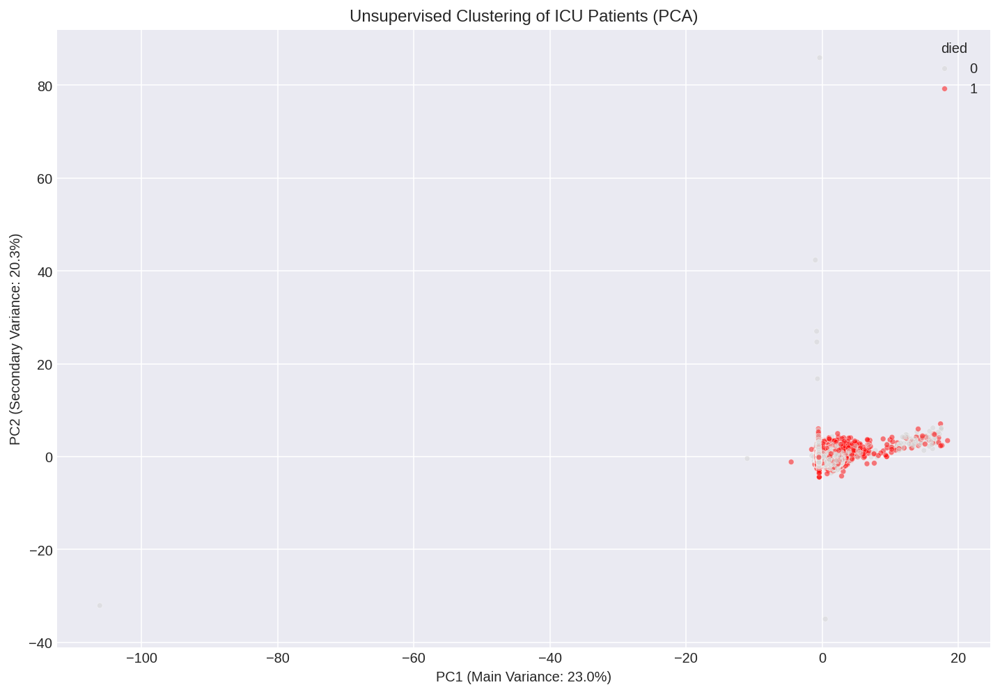


--- What do the axes represent? ---
              PC1       PC2
Temp     0.708321 -0.183043
Glucose  0.007526  0.008858
MAP     -0.003371  0.123343
HR      -0.011749  0.954549
SpO2    -0.705744 -0.200097


In [121]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Check Missingness (Should be much better now)
print("Missing values (%) after fixing IDs:")
print(phenotype_df.isnull().mean() * 100)

# 2. Impute Remaining Gaps with Clinical Normals
# Even with correct IDs, some patients won't have every test. We assume they are normal.
clean_df = phenotype_df.copy()
clean_df['HR'] = clean_df['HR'].fillna(80)
clean_df['MAP'] = clean_df['MAP'].fillna(85)
clean_df['SpO2'] = clean_df['SpO2'].fillna(98)
clean_df['Temp'] = clean_df['Temp'].fillna(37.0)
clean_df['Glucose'] = clean_df['Glucose'].fillna(6.0) # Normal glucose is ~5-7 mmol/L

# 3. Run PCA
features = ['HR', 'MAP', 'SpO2', 'Temp', 'Glucose']
x = StandardScaler().fit_transform(clean_df[features])

pca = PCA(n_components=2)
principalComponents = pca.fit_transform(x)
pca_df = pd.DataFrame(data=principalComponents, columns=['PC1', 'PC2'])
pca_df['died'] = clean_df['died'].values

# 4. Visualize the "Map of Patients"
plt.figure(figsize=(12, 8))
sns.scatterplot(
    data=pca_df,
    x='PC1',
    y='PC2',
    hue='died',
    alpha=0.5,
    palette={1: 'red', 0: 'lightgray'}, # Red = Died, Gray = Survived
    s=15 # Dot size
)
plt.title("Unsupervised Clustering of ICU Patients (PCA)")
plt.xlabel(f"PC1 (Main Variance: {pca.explained_variance_ratio_[0]:.1%})")
plt.ylabel(f"PC2 (Secondary Variance: {pca.explained_variance_ratio_[1]:.1%})")
plt.show()

# 5. Decode the Axes (The "Unexpected Pattern")
print("\n--- What do the axes represent? ---")
loadings = pd.DataFrame(pca.components_, columns=features, index=['PC1', 'PC2'])
print(loadings.T.sort_values(by='PC1', ascending=False))

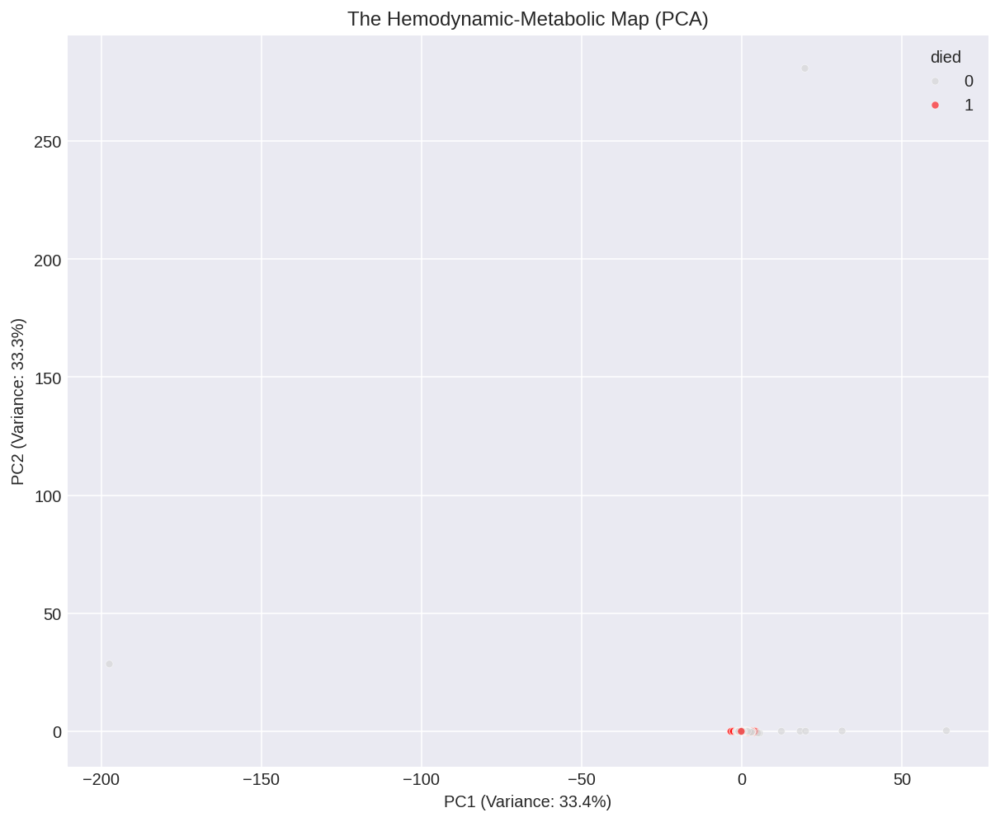


--- What drives the clusters? ---
              PC1       PC2
HR       0.707216  0.003065
MAP      0.703540 -0.101831
Glucose  0.069838  0.994797


In [122]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Select only the reliable columns
# We drop Temp and SpO2 because >50% missingness introduces too much noise
reliable_features = ['HR', 'MAP', 'Glucose']
clean_df = phenotype_df[reliable_features + ['died']].copy()

# 2. Impute the "Stable" Patients
# If MAP is missing, they likely don't have an arterial line -> Assume Normal (85)
# If Glucose is missing -> Assume Normal (6.0)
# If HR is missing -> Assume Normal (80)
clean_df['MAP'] = clean_df['MAP'].fillna(85)
clean_df['Glucose'] = clean_df['Glucose'].fillna(6.0)
clean_df['HR'] = clean_df['HR'].fillna(80)

# 3. Run PCA
x = StandardScaler().fit_transform(clean_df[reliable_features])

pca = PCA(n_components=2)
principalComponents = pca.fit_transform(x)
pca_df = pd.DataFrame(data=principalComponents, columns=['PC1', 'PC2'])
pca_df['died'] = clean_df['died'].values

# 4. Visualize
plt.figure(figsize=(10, 8))
sns.scatterplot(
    data=pca_df,
    x='PC1',
    y='PC2',
    hue='died',
    alpha=0.6,
    palette={1: 'red', 0: 'lightgray'}, # Red = Died
    s=20
)
plt.title("The Hemodynamic-Metabolic Map (PCA)")
plt.xlabel(f"PC1 (Variance: {pca.explained_variance_ratio_[0]:.1%})")
plt.ylabel(f"PC2 (Variance: {pca.explained_variance_ratio_[1]:.1%})")
plt.show()

# 5. Decode the "Unexpected Pattern"
print("\n--- What drives the clusters? ---")
loadings = pd.DataFrame(pca.components_, columns=reliable_features, index=['PC1', 'PC2'])
print(loadings.T.sort_values(by='PC1', ascending=False))

In [116]:
# Fill missing values with clinical defaults (Assumed Normal)
phenotype_df['pH'] = phenotype_df['pH'].fillna(7.40)
phenotype_df['FiO2'] = phenotype_df['FiO2'].fillna(21.0)
phenotype_df['SpO2'] = phenotype_df['SpO2'].fillna(98.0)
phenotype_df['HR'] = phenotype_df['HR'].fillna(phenotype_df['HR'].mean())
phenotype_df['MAP'] = phenotype_df['MAP'].fillna(phenotype_df['MAP'].mean())

# Now try PCA again
print("Remaining missing values:", phenotype_df.isnull().sum().sum())

Remaining missing values: 177970


Missing values before fixing:
visit_occurrence_id        0
died                       0
HR                     50569
MAP                    31535
SpO2                   51630
FiO2                   41804
RespRate               35460
Temp                   62829
Glucose                79681
pH                     46104
dtype: int64

Features used for PCA: ['HR', 'MAP', 'SpO2', 'FiO2', 'RespRate', 'Temp', 'pH']


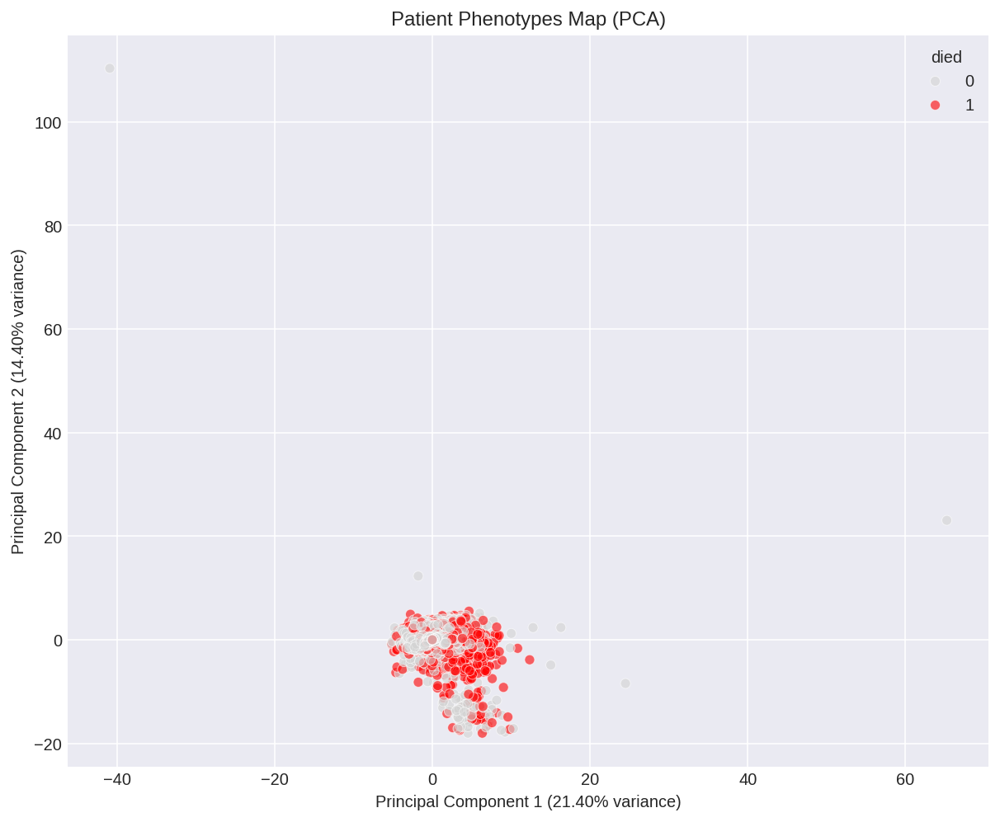


Feature Weights for PC1 (The X-Axis):
RespRate    0.543181
HR          0.521978
FiO2        0.507259
Temp        0.094891
MAP        -0.000348
SpO2       -0.254765
pH         -0.318233
dtype: float64


In [111]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Check which columns are empty
print("Missing values before fixing:")
print(phenotype_df.isnull().sum())

# 2. Impute Missing Values
# Create a copy to avoid warnings
clean_df = phenotype_df.copy()
features = ['HR', 'MAP', 'SpO2', 'FiO2', 'RespRate', 'Temp', 'Glucose', 'pH']

# Fill missing values with the mean of the column
for feature in features:
    mean_val = clean_df[feature].mean()
    clean_df[feature] = clean_df[feature].fillna(mean_val)

# Double check if any columns are STILL empty (meaning the whole column was null)
# If a column is entirely empty, we must drop the COLUMN, not the rows
clean_df = clean_df.dropna(axis=1, how='all')
# Update the features list to only include columns that survived
remaining_features = [f for f in features if f in clean_df.columns]

print(f"\nFeatures used for PCA: {remaining_features}")

if len(clean_df) > 0 and len(remaining_features) >= 2:
    # 3. Normalize (Standardize) the data
    x = StandardScaler().fit_transform(clean_df[remaining_features])

    # 4. Run PCA
    pca = PCA(n_components=2)
    principalComponents = pca.fit_transform(x)
    pca_df = pd.DataFrame(data=principalComponents, columns=['PC1', 'PC2'])
    pca_df['died'] = clean_df['died'].values

    # 5. Visualize
    plt.figure(figsize=(10, 8))
    sns.scatterplot(
        data=pca_df,
        x='PC1',
        y='PC2',
        hue='died',
        alpha=0.6,
        palette={1: 'red', 0: 'lightgray'} # 1=Died, 0=Survived
    )
    plt.title("Patient Phenotypes Map (PCA)")
    plt.xlabel(f"Principal Component 1 ({pca.explained_variance_ratio_[0]:.2%} variance)")
    plt.ylabel(f"Principal Component 2 ({pca.explained_variance_ratio_[1]:.2%} variance)")
    plt.show()

    # 6. Interpret the Components
    print("\nFeature Weights for PC1 (The X-Axis):")
    print(pd.Series(pca.components_[0], index=remaining_features).sort_values(ascending=False))
else:
    print("Error: The dataframe is still empty. This likely means your SQL query returned NULLs for every single column.")

--- Missing Data Report ---
                     Missing Count  Missing Percentage
Glucose                      79681          100.000000
Temp                         62829           78.850667
SpO2                         51630           64.795874
HR                           50569           63.464314
pH                           46104           57.860720
FiO2                         41804           52.464201
RespRate                     35460           44.502454
MAP                          31535           39.576562
died                             0            0.000000
visit_occurrence_id              0            0.000000


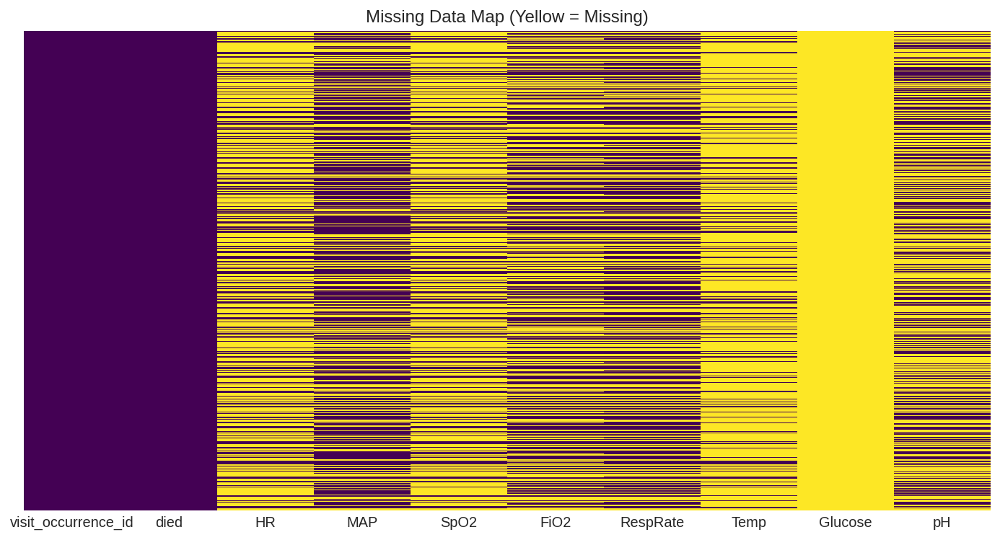

In [114]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Calculate Missing Count and Percentage
missing_data = pd.DataFrame({
    'Missing Count': phenotype_df.isnull().sum(),
    'Missing Percentage': (phenotype_df.isnull().sum() / len(phenotype_df)) * 100
})

# Sort by percentage to see the worst columns first
missing_data = missing_data.sort_values(by='Missing Percentage', ascending=False)

# Display the table
print("--- Missing Data Report ---")
print(missing_data)

# 2. Visualize it (Heatmap)
# This helps you see if missingness is random or if specific patients are missing EVERYTHING
plt.figure(figsize=(12, 6))
sns.heatmap(phenotype_df.isnull(), cbar=False, yticklabels=False, cmap='viridis')
plt.title("Missing Data Map (Yellow = Missing)")
plt.show()

In [109]:
%%bigquery time_bias_df
SELECT
    -- Extract Day of Week (1=Sunday, 2=Monday...)
    EXTRACT(DAYOFWEEK FROM visit_start_datetime) as day_of_week,
    -- Extract Hour of Admission
    EXTRACT(HOUR FROM visit_start_datetime) as hour_of_admission,

    COUNT(visit_occurrence_id) as total_admissions,
    AVG(CASE WHEN d.death_date IS NOT NULL THEN 1 ELSE 0 END) as mortality_rate

FROM `visit_occurrence` v
LEFT JOIN `person` p ON v.person_id = p.person_id
LEFT JOIN `death` d ON p.person_id = d.person_id
GROUP BY 1, 2
ORDER BY 1, 2

Query is running:   0%|          |

Downloading:   0%|          |

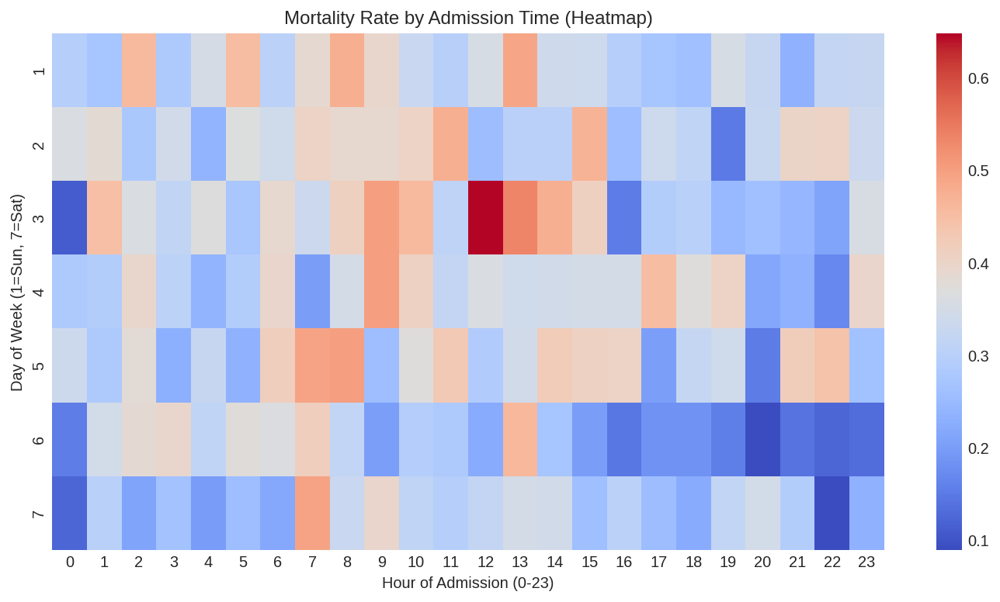

In [110]:
# Pivot for Heatmap
heatmap_data = time_bias_df.pivot(index='day_of_week', columns='hour_of_admission', values='mortality_rate')

plt.figure(figsize=(12, 6))
sns.heatmap(heatmap_data, cmap='coolwarm', annot=False)
plt.title("Mortality Rate by Admission Time (Heatmap)")
plt.ylabel("Day of Week (1=Sun, 7=Sat)")
plt.xlabel("Hour of Admission (0-23)")
plt.show()

In [112]:
%%bigquery missing_check
SELECT
    COUNT(*) as total_rows,
    COUNTIF(value_as_number IS NULL) as missing_values,
    ROUND(COUNTIF(value_as_number IS NULL) / COUNT(*) * 100, 2) as missing_percentage
FROM
    `measurement`

Query is running:   0%|          |

Downloading:   0%|          |

In [113]:
missing_check

,total_rows,missing_values,missing_percentage
0,386494880,480293,0.12


In [124]:
%%bigquery vaso_concepts
SELECT
    c.concept_id,
    c.concept_name,
    COUNT(*) as usage_count
FROM
    `drug_exposure` d
JOIN
    `concept` c ON d.drug_concept_id = c.concept_id
WHERE
    -- Search for common vasopressors (Note: Amsterdam uses "Noradrenaline")
    (LOWER(c.concept_name) LIKE '%norepinephrine%' OR LOWER(c.concept_name) LIKE '%noradrenaline%')
    OR (LOWER(c.concept_name) LIKE '%epinephrine%' OR LOWER(c.concept_name) LIKE '%adrenaline%')
    OR LOWER(c.concept_name) LIKE '%dopamine%'
    OR LOWER(c.concept_name) LIKE '%dobutamine%'
    OR LOWER(c.concept_name) LIKE '%vasopressin%'
    OR LOWER(c.concept_name) LIKE '%phenylephrine%'
GROUP BY
    c.concept_id, c.concept_name
ORDER BY
    usage_count DESC
LIMIT 20

Query is running:   0%|          |

Downloading:   0%|          |

In [125]:
vaso_concepts

,concept_id,concept_name,usage_count
0,1321341,norepinephrine,547514
1,1337860,dopamine,34070
2,1337720,dobutamine,14690
3,1343916,epinephrine,4938
4,1135766,phenylephrine,1303
5,36030108,articaine / epinephrine,114
6,36028719,lidocaine / norepinephrine,112
7,36029293,bupivacaine / epinephrine,1


In [126]:
%%bigquery vaso_usage_df
SELECT
    CASE
        WHEN REGEXP_CONTAINS(LOWER(c.concept_name), r'norepinephrine|noradrenaline') THEN 'Norepinephrine'
        WHEN REGEXP_CONTAINS(LOWER(c.concept_name), r'epinephrine|adrenaline') THEN 'Epinephrine'
        WHEN LOWER(c.concept_name) LIKE '%dopamine%' THEN 'Dopamine'
        WHEN LOWER(c.concept_name) LIKE '%dobutamine%' THEN 'Dobutamine'
        WHEN LOWER(c.concept_name) LIKE '%vasopressin%' THEN 'Vasopressin'
        WHEN LOWER(c.concept_name) LIKE '%phenylephrine%' THEN 'Phenylephrine'
        ELSE 'Other'
    END as vasopressor_type,
    COUNT(DISTINCT d.person_id) as unique_patients,
    COUNT(*) as total_administrations
FROM
    `drug_exposure` d
JOIN
    `concept` c ON d.drug_concept_id = c.concept_id
WHERE
    REGEXP_CONTAINS(LOWER(c.concept_name), r'norepinephrine|noradrenaline|epinephrine|adrenaline|dopamine|dobutamine|vasopressin|phenylephrine')
GROUP BY
    vasopressor_type
ORDER BY
    unique_patients DESC

Query is running:   0%|          |

Downloading:   0%|          |

In [128]:
vaso_usage_df

,vasopressor_type,unique_patients,total_administrations
0,Norepinephrine,22650,547626
1,Dopamine,7594,34070
2,Dobutamine,2332,14690
3,Epinephrine,1279,5053
4,Phenylephrine,808,1303


  vasopressor_type  unique_patients  total_administrations
0   Norepinephrine            22650                 547626
1         Dopamine             7594                  34070
2       Dobutamine             2332                  14690
3      Epinephrine             1279                   5053
4    Phenylephrine              808                   1303


/tmp/ipython-input-3842623478.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=vaso_usage_df, x='vasopressor_type', y='unique_patients', palette='viridis')


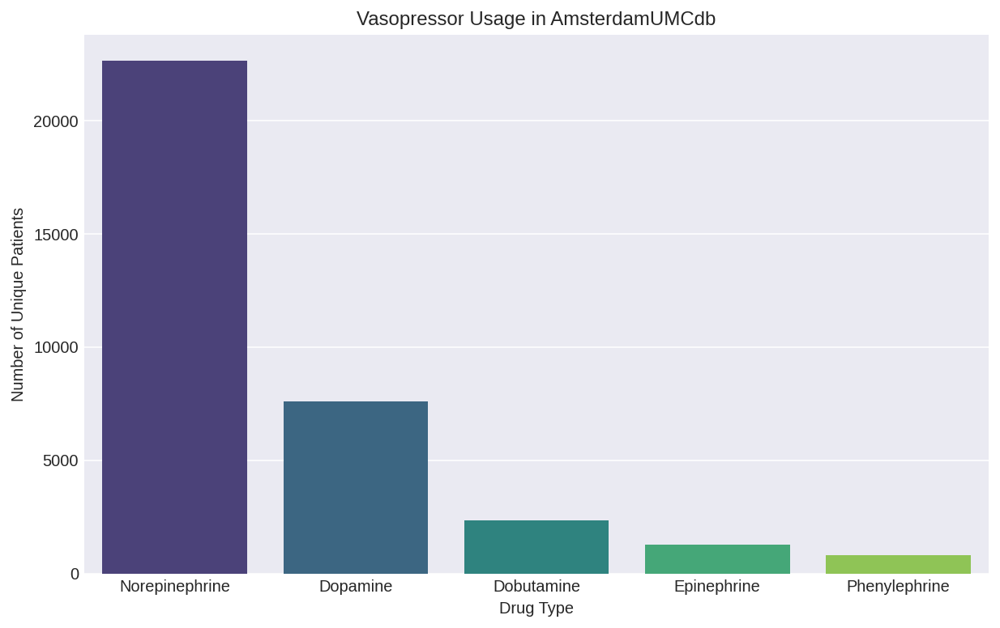

In [127]:
import seaborn as sns
import matplotlib.pyplot as plt

# Display the dataframe to check the numbers
print(vaso_usage_df)

# Plot
plt.figure(figsize=(10, 6))
sns.barplot(data=vaso_usage_df, x='vasopressor_type', y='unique_patients', palette='viridis')
plt.title("Vasopressor Usage in AmsterdamUMCdb")
plt.ylabel("Number of Unique Patients")
plt.xlabel("Drug Type")
plt.show()

In [130]:
%%bigquery rrt_proxy_concepts
SELECT
    'Measurement' as source_table,
    c.concept_id,
    c.concept_name,
    COUNT(DISTINCT m.person_id) as unique_patients
FROM
    `measurement` m
JOIN
    `concept` c ON m.measurement_concept_id = c.concept_id
WHERE
    -- Search for CVVH / Hemofiltration / Dialysis keywords
    REGEXP_CONTAINS(LOWER(c.concept_name), r'cvvh|hemofiltration|dialy|citra|substitutie')
GROUP BY 1, 2, 3

UNION ALL

SELECT
    'Drug' as source_table,
    c.concept_id,
    c.concept_name,
    COUNT(DISTINCT d.person_id) as unique_patients
FROM
    `drug_exposure` d
JOIN
    `concept` c ON d.drug_concept_id = c.concept_id
WHERE
    -- Search for Dialysis Fluids (Citrate is the gold standard marker in Amsterdam)
    REGEXP_CONTAINS(LOWER(c.concept_name), r'citra|dialy|hemofil')
GROUP BY 1, 2, 3
ORDER BY unique_patients DESC
LIMIT 20

Query is running:   0%|          |

Downloading:   0%|          |

In [131]:
rrt_proxy_concepts

,source_table,concept_id,concept_name,unique_patients
0,Measurement,2000000021,Blood flow CVVH,4236
1,Measurement,2000000063,Ultrafiltration set CVVH,3514
2,Measurement,2000000057,Substitution flow CVVH,2654
3,Measurement,2000000048,Pre filter pressure CVVH,2402
4,Measurement,2000000059,Transmembrane pressure CVVH,2045
5,Measurement,2000000064,Ultrafiltration total CVVH,2009
6,Measurement,2000000061,Ultrafiltration 1hour CVVH,1372
7,Measurement,2000000617,Substitution volume CVVH - total,1365
8,Measurement,2000000041,Filter pressure CVVH,1139
9,Measurement,2000000050,Predilution flow CVVH,1103


In [132]:
%%bigquery rrt_population
WITH rrt_patients AS (
    -- 1. Patients with RRT Measurements (Machine Settings)
    SELECT DISTINCT person_id
    FROM `measurement` m
    JOIN `concept` c ON m.measurement_concept_id = c.concept_id
    WHERE REGEXP_CONTAINS(LOWER(c.concept_name), r'cvvh|hemofiltration|dialyse')

    UNION DISTINCT

    -- 2. Patients receiving RRT Fluids (Citrate/Dialysate)
    SELECT DISTINCT person_id
    FROM `drug_exposure` d
    JOIN `concept` c ON d.drug_concept_id = c.concept_id
    WHERE REGEXP_CONTAINS(LOWER(c.concept_name), r'citra|dialys')
)

SELECT
    COUNT(*) as rrt_patient_count,
    (SELECT COUNT(DISTINCT person_id) FROM `person`) as total_population,
    ROUND(COUNT(*) / (SELECT COUNT(DISTINCT person_id) FROM `person`) * 100, 2) as prevalence_pct
FROM rrt_patients

Query is running:   0%|          |

Downloading:   0%|          |

In [133]:
rrt_population

,rrt_patient_count,total_population,prevalence_pct
0,4290,65397,6.56


--- RRT Indicators Found ---
   source_table  concept_id                      concept_name  unique_patients
0   Measurement  2000000021                   Blood flow CVVH             4236
1   Measurement  2000000063          Ultrafiltration set CVVH             3514
2   Measurement  2000000057            Substitution flow CVVH             2654
3   Measurement  2000000048          Pre filter pressure CVVH             2402
4   Measurement  2000000059       Transmembrane pressure CVVH             2045
5   Measurement  2000000064        Ultrafiltration total CVVH             2009
6   Measurement  2000000061        Ultrafiltration 1hour CVVH             1372
7   Measurement  2000000617  Substitution volume CVVH - total             1365
8   Measurement  2000000041              Filter pressure CVVH             1139
9   Measurement  2000000050             Predilution flow CVVH             1103
10  Measurement  2000000046            Postdilution flow CVVH             1024
11  Measurement  200000

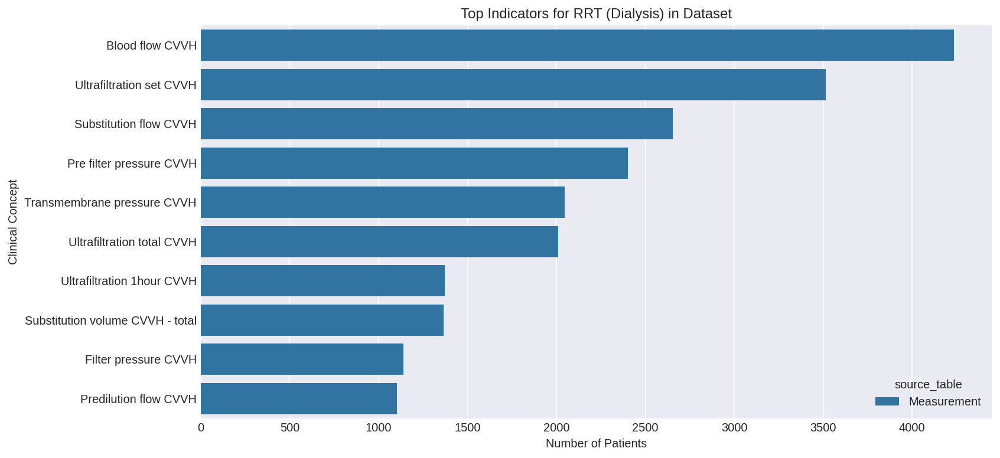

In [134]:
import seaborn as sns
import matplotlib.pyplot as plt

# Display the concepts found
print("--- RRT Indicators Found ---")
print(rrt_proxy_concepts)

# Display the total count
print("\n--- RRT Population Stats ---")
print(rrt_population)

# If we found concepts, visualize the top ones
if not rrt_proxy_concepts.empty:
    plt.figure(figsize=(12, 6))
    sns.barplot(
        data=rrt_proxy_concepts.head(10),
        x='unique_patients',
        y='concept_name',
        hue='source_table',
        dodge=False
    )
    plt.title("Top Indicators for RRT (Dialysis) in Dataset")
    plt.xlabel("Number of Patients")
    plt.ylabel("Clinical Concept")
    plt.show()

In [135]:
%%bigquery dialysate_types
SELECT
    c.concept_id,
    c.concept_name,
    COUNT(*) as usage_count
FROM
    `drug_exposure` d
JOIN
    `concept` c ON d.drug_concept_id = c.concept_id
WHERE
    -- Search for keywords related to hemofiltration fluids
    REGEXP_CONTAINS(LOWER(c.concept_name), r'citra|dialys|substitutie|hemofil|bicarbonat|lactat')
GROUP BY
    1, 2
ORDER BY
    usage_count DESC
LIMIT 20

Query is running:   0%|          |

Downloading:   0%|          |

In [136]:
dialysate_types

,concept_id,concept_name,usage_count
0,939506,sodium bicarbonate,21378
1,977968,sodium citrate,719
2,767410,lithium citrate,167
3,976545,potassium citrate,112
4,19027080,potassium bicarbonate,18
5,36028316,alginic acid / sodium bicarbonate,5
6,967861,magnesium citrate,4
7,19058572,calcium citrate,3


In [137]:
%%bigquery other_rrt_types
SELECT
    c.concept_id,
    c.concept_name,
    COUNT(DISTINCT m.person_id) as unique_patients
FROM
    `measurement` m
JOIN
    `concept` c ON m.measurement_concept_id = c.concept_id
WHERE
    -- Search for Dialysis keywords
    (REGEXP_CONTAINS(LOWER(c.concept_name), r'dialy|hemofil|periton|scuf'))
    -- EXCLUDE the dominant CVVH type to see what else exists
    AND NOT REGEXP_CONTAINS(LOWER(c.concept_name), r'cvvh')
GROUP BY
    1, 2
ORDER BY
    unique_patients DESC
LIMIT 20

Query is running:   0%|          |

Downloading:   0%|          |

In [138]:
other_rrt_types

,concept_id,concept_name,unique_patients
0,2000000038,Duration of dialysis,779
1,3023487,Leukocytes [#/volume] in Peritoneal fluid,129
2,3026692,Albumin [Mass/volume] in Peritoneal fluid,119
3,3002331,Protein [Mass/volume] in Peritoneal fluid,73
4,3008581,Lactate dehydrogenase [Enzymatic activity/volu...,71
5,3008691,Amylase [Enzymatic activity/volume] in Periton...,44
6,3023386,Triglyceride [Mass/volume] in Peritoneal fluid,44
7,3023044,Glucose [Moles/volume] in Peritoneal fluid,41
8,3042045,Bilirubin.total [Moles/volume] in Peritoneal f...,37
9,3045996,Lipase [Enzymatic activity/volume] in Peritone...,12


In [140]:
%%bigquery los_stats
SELECT
    -- 1. Total Population
    COUNT(DISTINCT visit_occurrence_id) as total_admissions,

    -- 2. Target Population (> 24 Hours)
    COUNT(DISTINCT CASE
        WHEN TIMESTAMP_DIFF(visit_end_datetime, visit_start_datetime, HOUR) > 24
        THEN visit_occurrence_id END) as admissions_gt_24h,

    -- 3. Unique Patients > 24 Hours (Some patients have multiple long stays)
    COUNT(DISTINCT CASE
        WHEN TIMESTAMP_DIFF(visit_end_datetime, visit_start_datetime, HOUR) > 24
        THEN person_id END) as patients_gt_24h,

    -- 4. Percentage
    ROUND(
        COUNT(DISTINCT CASE
            WHEN TIMESTAMP_DIFF(visit_end_datetime, visit_start_datetime, HOUR) > 24
            THEN visit_occurrence_id END)
        / COUNT(DISTINCT visit_occurrence_id) * 100, 2
    ) as pct_of_total_admissions

FROM `visit_occurrence`

Query is running:   0%|          |

Downloading:   0%|          |

In [141]:
los_stats

,total_admissions,admissions_gt_24h,patients_gt_24h,pct_of_total_admissions
0,79838,46787,39710,58.6


In [142]:
%%bigquery los_data
SELECT
    visit_occurrence_id,
    TIMESTAMP_DIFF(visit_end_datetime, visit_start_datetime, HOUR) as los_hours
FROM `visit_occurrence`
WHERE TIMESTAMP_DIFF(visit_end_datetime, visit_start_datetime, HOUR) > 0 -- Remove data errors

Query is running:   0%|          |

Downloading:   0%|          |

In [143]:
los_data

,visit_occurrence_id,los_hours
0,71210,1
1,78149,1
2,25248,1
3,3827,1
4,35778,1
...,...,...
79403,30390,18
79404,73541,36
79405,66949,46
79406,49409,65


In [144]:
%%bigquery los_data
SELECT
    visit_occurrence_id,
    TIMESTAMP_DIFF(visit_end_datetime, visit_start_datetime, HOUR) as los_hours
FROM `visit_occurrence`
WHERE TIMESTAMP_DIFF(visit_end_datetime, visit_start_datetime, HOUR) > 0 -- Remove data errors

Query is running:   0%|          |

Downloading:   0%|          |

In [146]:
los_data

,visit_occurrence_id,los_hours
0,71210,1
1,78149,1
2,25248,1
3,3827,1
4,35778,1
...,...,...
79403,30390,18
79404,73541,36
79405,66949,46
79406,49409,65


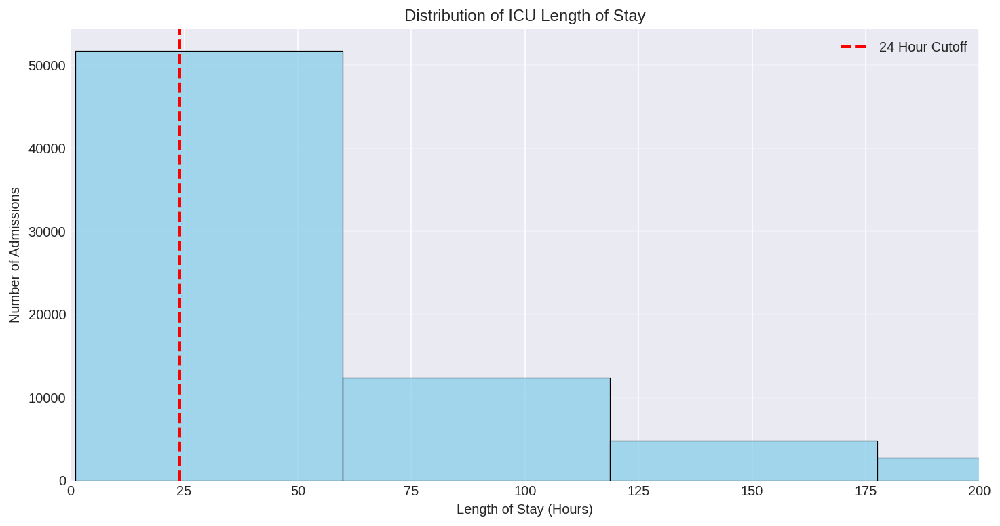

Total Admissions available for modeling (>24h): 46787


In [145]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set up the figure
plt.figure(figsize=(12, 6))

# Create Histogram
# We limit x-axis to 500 hours (~3 weeks) to keep the plot readable
sns.histplot(data=los_data, x='los_hours', bins=100, color='skyblue', edgecolor='black')

# Add the 24-hour Cutoff Line
plt.axvline(x=24, color='red', linestyle='--', linewidth=2, label='24 Hour Cutoff')

# Formatting
plt.title("Distribution of ICU Length of Stay")
plt.xlabel("Length of Stay (Hours)")
plt.ylabel("Number of Admissions")
plt.xlim(0, 200) # Zoom in on the first week
plt.legend()
plt.grid(axis='y', alpha=0.3)
plt.show()

# Print the exact number of rows available for your model
print(f"Total Admissions available for modeling (>24h): {len(los_data[los_data['los_hours'] > 24])}")

In [147]:
%%bigquery cohort_validation
SELECT
    CASE
        WHEN TIMESTAMP_DIFF(v.visit_end_datetime, v.visit_start_datetime, HOUR) > 24 THEN 'Target Cohort (>24h)'
        ELSE 'Excluded (<24h)'
    END as cohort_group,

    COUNT(DISTINCT v.visit_occurrence_id) as total_admissions,

    -- Count Deaths
    COUNT(DISTINCT d.person_id) as total_deaths,

    -- Mortality Rate
    ROUND(COUNT(DISTINCT d.person_id) / COUNT(DISTINCT v.visit_occurrence_id) * 100, 2) as mortality_rate_pct

FROM `visit_occurrence` v
LEFT JOIN `person` p ON v.person_id = p.person_id
LEFT JOIN `death` d ON p.person_id = d.person_id
GROUP BY 1
ORDER BY 1

Query is running:   0%|          |

Downloading:   0%|          |

In [148]:
cohort_validation

,cohort_group,total_admissions,total_deaths,mortality_rate_pct
0,Excluded (<24h),33051,3738,11.31
1,Target Cohort (>24h),46787,8546,18.27


           cohort_group  total_admissions  total_deaths  mortality_rate_pct
0       Excluded (<24h)             33051          3738               11.31
1  Target Cohort (>24h)             46787          8546               18.27


/tmp/ipython-input-2352502295.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


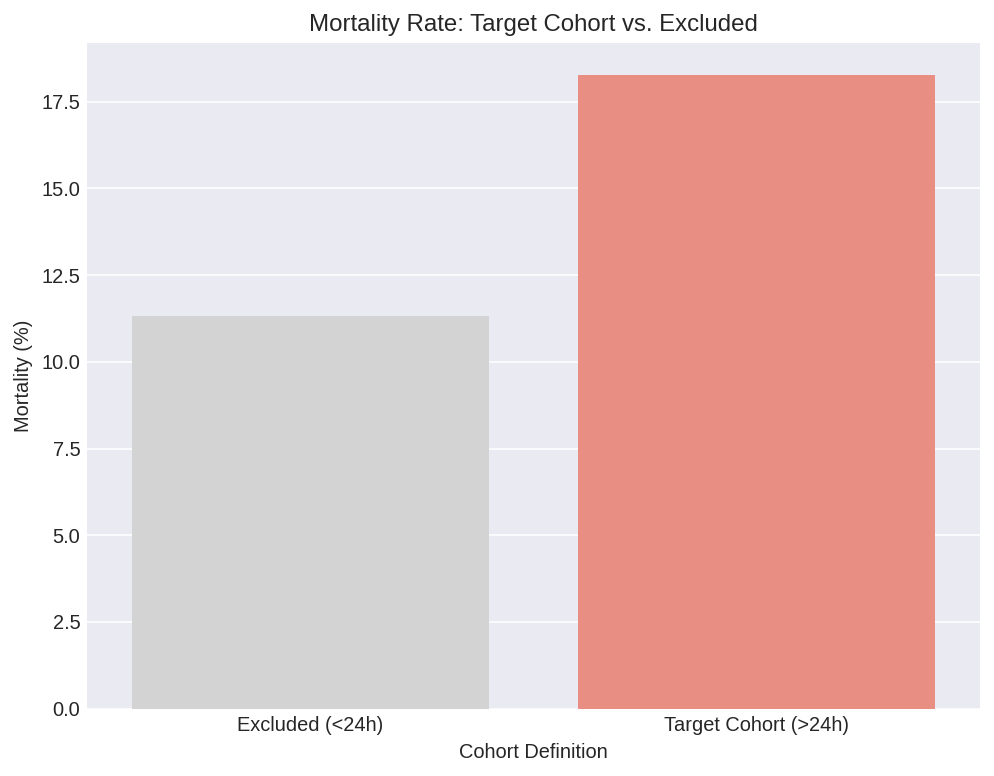

In [149]:
import seaborn as sns
import matplotlib.pyplot as plt

# Display the data
print(cohort_validation)

# Plot
plt.figure(figsize=(8, 6))
sns.barplot(
    data=cohort_validation,
    x='cohort_group',
    y='mortality_rate_pct',
    palette={'Target Cohort (>24h)': 'salmon', 'Excluded (<24h)': 'lightgray'}
)
plt.title("Mortality Rate: Target Cohort vs. Excluded")
plt.ylabel("Mortality (%)")
plt.xlabel("Cohort Definition")
plt.show()

In [150]:
%%bigquery los_stats_df
SELECT
    COUNT(*) as total_admissions,

    -- Central Tendency & Spread (Parametric)
    ROUND(AVG(los_days), 2) as mean_los_days,
    ROUND(STDDEV(los_days), 2) as std_dev_days,

    -- Quartiles (Non-Parametric - Better for ICU data)
    ROUND(APPROX_QUANTILES(los_days, 100)[OFFSET(25)], 2) as p25_Q1,
    ROUND(APPROX_QUANTILES(los_days, 100)[OFFSET(50)], 2) as median_Q2,
    ROUND(APPROX_QUANTILES(los_days, 100)[OFFSET(75)], 2) as p75_Q3,

    -- Interquartile Range (IQR)
    ROUND(
        APPROX_QUANTILES(los_days, 100)[OFFSET(75)] -
        APPROX_QUANTILES(los_days, 100)[OFFSET(25)], 2
    ) as iqr,

    -- Range
    ROUND(MIN(los_days), 2) as min_los,
    ROUND(MAX(los_days), 2) as max_los

FROM (
    SELECT
        TIMESTAMP_DIFF(visit_end_datetime, visit_start_datetime, HOUR) / 24.0 as los_days
    FROM `visit_occurrence`
    -- Filter out data errors (negative time)
    WHERE visit_end_datetime > visit_start_datetime
)

Query is running:   0%|          |

Downloading:   0%|          |

In [151]:
los_stats_df

,total_admissions,mean_los_days,std_dev_days,p25_Q1,median_Q2,p75_Q3,iqr,min_los,max_los
0,79690,4.11,8.27,0.83,1.5,3.71,2.88,0.0,245.25


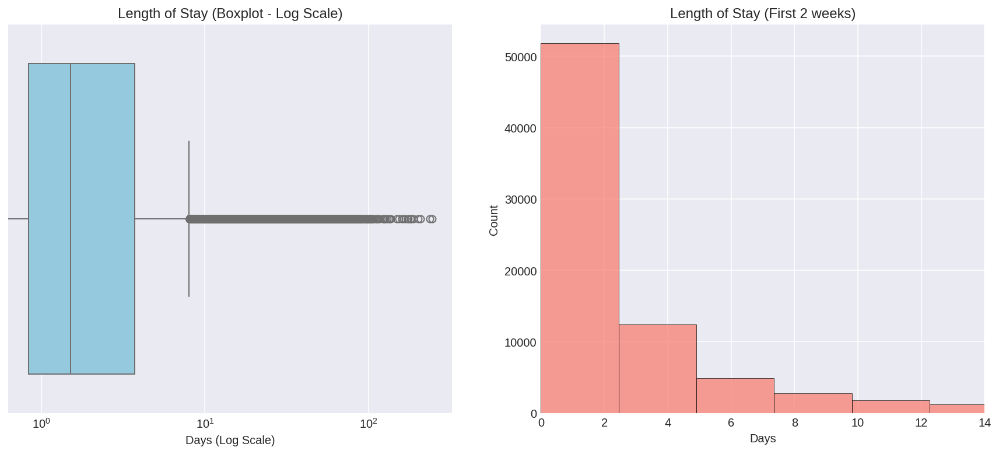

   total_admissions  mean_los_days  std_dev_days  p25_Q1  median_Q2  p75_Q3  \
0             79690           4.11          8.27    0.83        1.5    3.71   

    iqr  min_los  max_los  
0  2.88      0.0   245.25  


In [152]:
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Get the raw data for plotting
# (We need the raw rows, not just the summary, to make a boxplot)
query = """
SELECT
    TIMESTAMP_DIFF(visit_end_datetime, visit_start_datetime, HOUR) / 24.0 as los_days
FROM `visit_occurrence`
WHERE visit_end_datetime > visit_start_datetime
"""
# Run query using the client you set up earlier
# Assuming 'client' is your BigQuery client object
los_data = client.query(query).to_dataframe()

# 2. Create the Plot
fig, ax = plt.subplots(1, 2, figsize=(15, 6))

# Plot A: Boxplot (Log Scale)
# We use log scale because the "Long Tail" makes a normal plot unreadable
sns.boxplot(x=los_data['los_days'], ax=ax[0], color='skyblue')
ax[0].set_xscale('log')
ax[0].set_title('Length of Stay (Boxplot - Log Scale)')
ax[0].set_xlabel('Days (Log Scale)')

# Plot B: Histogram (Truncated)
# Zoom in on the first 14 days to see the main distribution
sns.histplot(los_data['los_days'], bins=100, ax=ax[1], color='salmon', edgecolor='black')
ax[1].set_xlim(0, 14)
ax[1].set_title('Length of Stay (First 2 weeks)')
ax[1].set_xlabel('Days')

plt.show()

# Print the Summary Table from Step 1
print(los_stats_df)

In [155]:
%%bigquery bad_data_stats
SELECT
    -- 1. Total Admissions in the raw table
    COUNT(*) as total_raw_admissions,

    -- 2. Count of Bad Data (Zero or Negative Duration)
    COUNTIF(visit_end_datetime <= visit_start_datetime) as bad_admissions_count,

    -- 3. Percentage of Bad Data
    ROUND(COUNTIF(visit_end_datetime <= visit_start_datetime) / COUNT(*) * 100, 3) as bad_data_percentage

FROM `visit_occurrence`

Query is running:   0%|          |

Downloading:   0%|          |

In [156]:
bad_data_stats

,total_raw_admissions,bad_admissions_count,bad_data_percentage
0,79838,46,0.058


In [157]:
%%bigquery missing_dates
SELECT
    -- 1. Zero or Negative Duration (The 46)
    COUNTIF(visit_end_datetime <= visit_start_datetime) as bad_dates,

    -- 2. NULL End Dates (The 102)
    COUNTIF(visit_end_datetime IS NULL) as active_admissions,

    -- 3. Total Excluded
    COUNTIF(visit_end_datetime <= visit_start_datetime OR visit_end_datetime IS NULL) as total_excluded
FROM `visit_occurrence`

Query is running:   0%|          |

Downloading:   0%|          |

In [158]:
missing_dates

,bad_dates,active_admissions,total_excluded
0,46,102,148


In [9]:
%%bigquery final_cohort_list
SELECT
    v.visit_occurrence_id,
    v.person_id,
    v.visit_start_datetime,
    v.visit_end_datetime,

    -- Calculate Age
    (EXTRACT(YEAR FROM v.visit_start_date) - p.year_of_birth) as age,

    -- Calculate LOS (Hours)
    TIMESTAMP_DIFF(v.visit_end_datetime, v.visit_start_datetime, HOUR) as los_hours,

    -- Outcome (Mortality)
    CASE WHEN d.death_date IS NOT NULL THEN 1 ELSE 0 END as mortality_label

FROM `visit_occurrence` v
JOIN `person` p ON v.person_id = p.person_id
LEFT JOIN `death` d ON p.person_id = d.person_id

WHERE
    -- 1. CLEANING: Remove the 148 bad rows
    v.visit_end_datetime IS NOT NULL
    AND v.visit_end_datetime > v.visit_start_datetime

    -- 2. ADULTS ONLY: Standard ICU criteria
    AND (EXTRACT(YEAR FROM v.visit_start_date) - p.year_of_birth) >= 18

    -- 3. TARGET POPULATION: Stay > 24 Hours (The "Deterioration" Cohort)
    AND TIMESTAMP_DIFF(v.visit_end_datetime, v.visit_start_datetime, HOUR) > 24

ORDER BY v.visit_occurrence_id

Query is running:   0%|          |

Downloading:   0%|          |

In [10]:
final_cohort_list

,visit_occurrence_id,person_id,visit_start_datetime,visit_end_datetime,age,los_hours,mortality_label
0,1,6683,2017-01-01 00:00:00+00:00,2017-01-18 08:52:00+00:00,75,416,0
1,4,40921,2017-01-01 00:00:00+00:00,2017-01-02 23:15:00+00:00,65,47,1
2,7,11547,2002-01-01 00:00:00+00:00,2002-01-07 13:13:00+00:00,45,157,0
3,10,23505,2002-01-01 00:00:00+00:00,2002-01-04 00:25:00+00:00,55,72,0
4,11,36849,2017-01-01 00:00:00+00:00,2017-01-03 14:37:00+00:00,75,62,0
...,...,...,...,...,...,...,...
49356,79823,25846,2010-01-01 00:00:00+00:00,2010-01-06 03:26:00+00:00,45,123,0
49357,79826,39472,2017-01-01 00:00:00+00:00,2017-01-05 22:34:00+00:00,85,118,0
49358,79832,29004,2010-01-01 00:00:00+00:00,2010-01-02 14:40:00+00:00,29,38,0
49359,79833,30996,2002-01-01 00:00:00+00:00,2002-01-08 22:42:00+00:00,75,190,0


In [11]:
%%bigquery echo_data
SELECT
    c.concept_id,
    c.concept_name,
    COUNT(DISTINCT m.person_id) as unique_patients,
    COUNT(*) as total_measurements,

    -- Check the values to see if they look like percentages (e.g., 30-70)
    ROUND(AVG(m.value_as_number), 1) as avg_value,
    MIN(m.value_as_number) as min_value,
    MAX(m.value_as_number) as max_value

FROM `measurement` m
JOIN `concept` c ON m.measurement_concept_id = c.concept_id
WHERE
    -- Search for Ejection Fraction or Echo keywords
    REGEXP_CONTAINS(LOWER(c.concept_name), r'ejection fraction|lvef|lv function|echocardiogra')
GROUP BY
    1, 2
ORDER BY
    unique_patients DESC

Query is running:   0%|          |

Downloading: |          |

In [13]:
echo_data

,concept_id,concept_name,unique_patients,total_measurements,avg_value,min_value,max_value


In [14]:
%%bigquery imaging_metadata
SELECT
    c.concept_id,
    c.concept_name,
    COUNT(DISTINCT m.person_id) as unique_patients
FROM
    `measurement` m
JOIN
    `concept` c ON m.measurement_concept_id = c.concept_id
WHERE
    -- Search for X-ray, CT, MRI, Ultrasound keywords (English and Dutch)
    REGEXP_CONTAINS(LOWER(c.concept_name), r'x-ray|xray|thorax|chest|ct scan|computed tomography|mri|magnetic resonance|ultrasound|echo')
GROUP BY
    1, 2
ORDER BY
    unique_patients DESC
LIMIT 20

Query is running:   0%|          |

Downloading:   0%|          |

In [15]:
imaging_metadata

,concept_id,concept_name,unique_patients
0,2000000486,Chest tube air leakage,11866
1,3026556,Fluid output chest tube,9844
2,2000000475,Chest tube suction,290
3,2000000234,Chest wall compliance,79


No structured Echocardiogram data found.

--- Other Imaging Metadata ---
   concept_id             concept_name  unique_patients
0  2000000486   Chest tube air leakage            11866
1     3026556  Fluid output chest tube             9844
2  2000000475       Chest tube suction              290
3  2000000234    Chest wall compliance               79


/tmp/ipython-input-1266190898.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


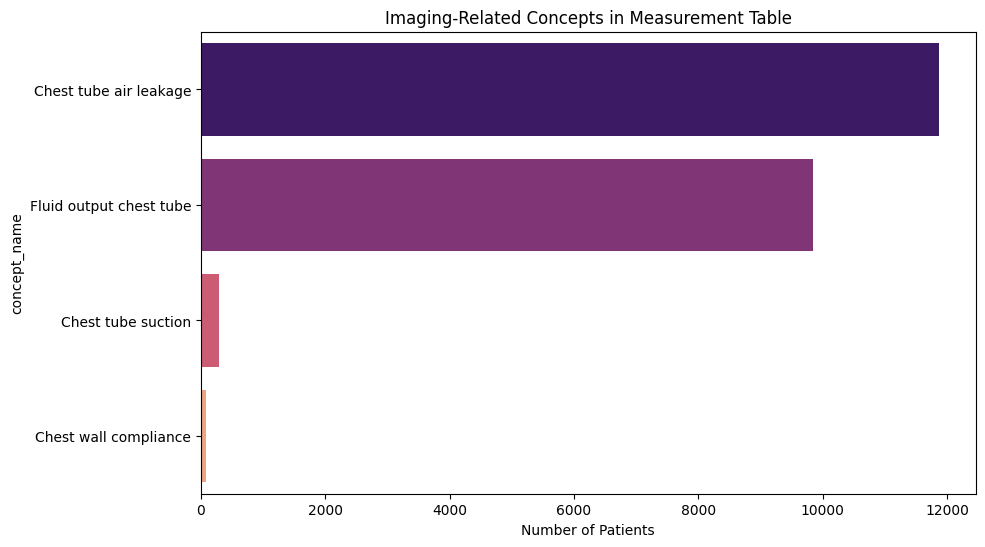

In [16]:
import seaborn as sns
import matplotlib.pyplot as plt

# Check if we found Echo data
if 'echo_data' in globals() and not echo_data.empty:
    print("--- Echocardiogram Data Found ---")
    print(echo_data)
else:
    print("No structured Echocardiogram data found.")

# Check if we found other imaging
if 'imaging_metadata' in globals() and not imaging_metadata.empty:
    print("\n--- Other Imaging Metadata ---")
    print(imaging_metadata)

    # Plot the top imaging concepts found
    plt.figure(figsize=(10, 6))
    sns.barplot(
        data=imaging_metadata.head(10),
        x='unique_patients',
        y='concept_name',
        palette='magma'
    )
    plt.title("Imaging-Related Concepts in Measurement Table")
    plt.xlabel("Number of Patients")
    plt.show()

In [17]:
%%bigquery cardiac_proxies
SELECT
    c.concept_id,
    c.concept_name,
    COUNT(DISTINCT m.person_id) as unique_patients,
    ROUND(AVG(m.value_as_number), 1) as avg_value
FROM
    `measurement` m
JOIN
    `concept` c ON m.measurement_concept_id = c.concept_id
WHERE
    -- Search for CVP, Cardiac Output, or BNP (Lab test for heart failure)
    REGEXP_CONTAINS(LOWER(c.concept_name), r'central venous pressure|cvp|cardiac output|ci |cardiac index|bnp|pro-bnp')
GROUP BY
    1, 2
ORDER BY
    unique_patients DESC
LIMIT 20

Query is running:   0%|          |

Downloading:   0%|          |

In [18]:
cardiac_proxies

,concept_id,concept_name,unique_patients,avg_value
0,21490675,Central venous pressure (CVP),28596,10.1
1,3000333,Central venous pressure (CVP) Mean,15401,15.2
2,3005555,Left ventricular Cardiac output,8923,5.3
3,21490712,Left ventricular Cardiac index,2580,2.8
4,21492228,Left ventricular Cardiac output by Continuous,2195,5.5
5,3002309,Left ventricular Cardiac output by Indicator d...,130,6.2


## Display the `person` dataframe.

In [62]:
person

,person_id,gender_concept_id,year_of_birth,month_of_birth,day_of_birth,birth_datetime,race_concept_id
0,16819,<NA>,1917,1,1,1917-01-01 00:00:00+00:00,0
1,26082,<NA>,1917,1,1,1917-01-01 00:00:00+00:00,0
2,10193,<NA>,1917,1,1,1917-01-01 00:00:00+00:00,0
3,35113,<NA>,1917,1,1,1917-01-01 00:00:00+00:00,0
4,3703,<NA>,1917,1,1,1917-01-01 00:00:00+00:00,0
...,...,...,...,...,...,...,...
65392,53492,8532,1988,1,1,1988-01-01 00:00:00+00:00,0
65393,64874,8532,1988,1,1,1988-01-01 00:00:00+00:00,0
65394,278,8532,1988,1,1,1988-01-01 00:00:00+00:00,0
65395,12099,8532,1988,1,1,1988-01-01 00:00:00+00:00,0


In [63]:
from google.colab import sheets
sheet = sheets.InteractiveSheet(df=person)

https://docs.google.com/spreadsheets/d/1bZguXQmvIjCx3gXt7B6NxhCNAkEf9W7oR7x7Ivc4t_I/edit#gid=0


# Query AmsterdamUMCdb through google-cloud-bigquery

Alternatively, we can manually invoke the `biqquery` Python module. The following examples re-use the previously entered `PROJECT_ID` from [Retrieving your Google Cloud Project ID](#cell-project-id). For more information, see [BigQuery documentation](https://cloud.google.com/bigquery/docs) and [library reference documentation](https://googleapis.dev/python/bigquery/latest/index.html).


## Set the default query job configuration for google-cloud-bigquery client

In [28]:
from google.cloud import bigquery

# BigQuery requires a separate config to prevent the 'BadRequest: 400 Cannot explicitly modify anonymous table' error message
job_config = bigquery.job.QueryJobConfig()

# sets default client settings by re-using the previously defined config
client = bigquery.Client(project=PROJECT_ID, location=LOCATION, default_query_job_config=def_config)

## Get all patients and group by year of birth

In [29]:
year_of_birth = client.query(
    '''
    SELECT
      year_of_birth
      , COUNT(*) AS number_of_admissions -- COUNT(*) counts everything including NULL
    FROM person
    GROUP BY year_of_birth
    ORDER BY year_of_birth ASC
    '''
    , job_config=job_config).to_dataframe()

year_of_birth

,year_of_birth,number_of_admissions
0,1917,1550
1,1925,2559
2,1927,4642
3,1932,1758
4,1935,6568
5,1937,4383
6,1942,6035
7,1945,7016
8,1947,3070
9,1952,5770


## Show a plot
Uses the Pandas built-in functions to plot a bar chart.

<Axes: xlabel='year_of_birth'>

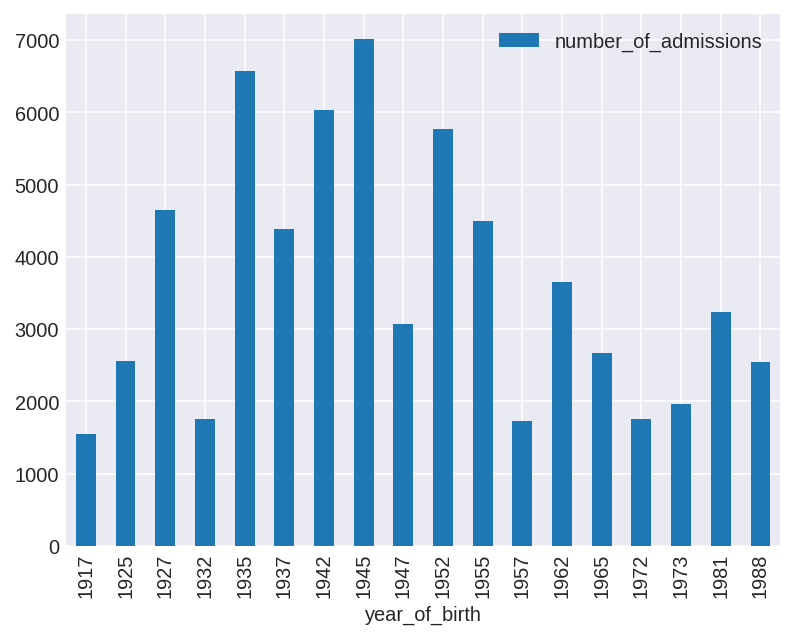

In [30]:
# modifies the pyplot back-end of Pandas to increase render resolution
import matplotlib.pyplot as plt
plt.style.use('seaborn-v0_8-darkgrid')
plt.rcParams["figure.dpi"] = 144

year_of_birth.plot(kind='bar', x='year_of_birth')

# Visit_occurrence
This table stores information about the ICU admissions. Patients (`person`) can have multiple visit_occurrence records.

This table is very similar to the legacy `admissions` table.

In [31]:
visit_occurrence = client.query(
    '''
    SELECT *
    FROM visit_occurrence
    '''
    , job_config=job_config).to_dataframe()

visit_occurrence

,visit_occurrence_id,person_id,visit_concept_id,visit_start_date,visit_start_datetime,visit_end_date,visit_end_datetime,visit_type_concept_id,visit_source_value,admitted_from_concept_id,discharged_to_concept_id,admitted_from_source_value,discharged_to_source_value
0,38018,60705,9201,2002-01-01,2002-01-01 11:41:00+00:00,NaT,NaT,32827,icu,0,0,None,None
1,26812,6336,9201,2002-01-01,2002-01-01 00:00:00+00:00,2002-01-01,2002-01-01 00:01:00+00:00,32827,icu,0,0,None,None
2,72441,32512,9201,2002-01-01,2002-01-01 00:00:00+00:00,2002-01-01,2002-01-01 00:01:00+00:00,32827,icu,0,0,None,None
3,70071,10206,9201,2002-01-01,2002-01-01 00:00:00+00:00,2002-01-01,2002-01-01 00:01:00+00:00,32827,icu,0,0,None,None
4,31479,47522,9201,2002-01-01,2002-01-01 00:00:00+00:00,2002-01-01,2002-01-01 00:01:00+00:00,32827,icu,0,0,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...
79833,30390,50232,9201,2023-05-19,2023-05-19 03:26:00+00:00,2023-05-19,2023-05-19 22:20:00+00:00,32827,icu,0,0,None,None
79834,73541,50232,9201,2023-06-01,2023-06-01 10:01:00+00:00,2023-06-02,2023-06-02 22:34:00+00:00,32827,icu,0,0,None,None
79835,66949,40798,9201,2023-07-07,2023-07-07 23:46:00+00:00,2023-07-09,2023-07-09 21:56:00+00:00,32827,icu,0,0,None,None
79836,49409,57957,9201,2023-08-27,2023-08-27 02:03:00+00:00,2023-08-29,2023-08-29 19:45:00+00:00,32827,icu,0,0,None,None


In [32]:
provider = client.query(
    '''
    SELECT *
    FROM provider
    '''
    , job_config=job_config).to_dataframe()

provider

NotFound: 404 Not found: Table amsterdamumcdb:van_gogh_2026_datathon.provider was not found in location EU; reason: notFound, message: Not found: Table amsterdamumcdb:van_gogh_2026_datathon.provider was not found in location EU

Location: EU
Job ID: f5e889c6-1369-430a-b267-9eb250fd7be7


## Concept

In [ ]:
concept = client.query(
    '''
    SELECT *
    FROM concept
    WHERE concept_id = 38004497
    '''
    , job_config=job_config).to_dataframe()

concept

In [14]:
display(visit_occurrence.describe())

,visit_occurrence_id,person_id,visit_concept_id,visit_type_concept_id,admitted_from_concept_id,discharged_to_concept_id
count,79838.0,79838.0,79838.0,79838.0,79838.0,79838.0
mean,39918.5,32680.038566,9201.0,32827.0,0.0,0.0
std,23047.389733,18880.089347,0.0,0.0,0.0,0.0
min,0.0,0.0,9201.0,32827.0,0.0,0.0
25%,19959.25,16294.0,9201.0,32827.0,0.0,0.0
50%,39918.5,32698.5,9201.0,32827.0,0.0,0.0
75%,59877.75,48998.75,9201.0,32827.0,0.0,0.0
max,79837.0,65396.0,9201.0,32827.0,0.0,0.0


In [15]:
display(visit_occurrence.columns)

Index(['visit_occurrence_id', 'person_id', 'visit_concept_id',
       'visit_start_date', 'visit_start_datetime', 'visit_end_date',
       'visit_end_datetime', 'visit_type_concept_id', 'visit_source_value',
       'admitted_from_concept_id', 'discharged_to_concept_id',
       'admitted_from_source_value', 'discharged_to_source_value'],
      dtype='object')

# Query AmsterdamUMCdb through pandas-gbq

The third option is to query the dataset using the Pandas `pandas-gbq` library. Especially when you are already familiar with the `pandas.read_sql` function, it's relatively straightforward to modify your existing code to be compatible with BigQuery. For more information, see [Pandas GBQ Documentation](https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.read_gbq.html).


**Note**: The `use_bqstorage_api=True` statement enables the Google Cloud BigQuery Storage API that improves the performance of copying data from BiqQuery to pandas DataFrames in the Colab environment (~around 16 times). While the usage of the Storage Read API is being charged separately, Google currently offers a free tier of 300 TB per month. However, you may choose to remove the option from the command.

## Set the default query job configuration for pandas-gbq

In [33]:
import pandas as pd

config_gbq = {'query':
          {'defaultDataset': {
              "datasetId": DATASET_ID,
              "projectId": DATASET_PROJECT_ID
              },
           'Location': LOCATION}
           }

## Retrieve the medical specialty associated with each admission

In [36]:
specialties = pd.read_gbq(
    '''
    SELECT concept_name AS specialty, COUNT(*) AS number_of_admissions
    FROM visit_occurrence v
    LEFT JOIN provider p ON p.provider_id = v.provider_id
    LEFT JOIN concept c ON c.concept_id = p.specialty_concept_id

    GROUP BY specialty
    ORDER BY number_of_admissions DESC
    '''
    , configuration=config_gbq, use_bqstorage_api=True)
specialties.plot(kind='bar', x='specialty')

/tmp/ipython-input-3199823195.py:1: FutureWarning: read_gbq is deprecated and will be removed in a future version. Please use pandas_gbq.read_gbq instead: https://pandas-gbq.readthedocs.io/en/latest/api.html#pandas_gbq.read_gbq
  specialties = pd.read_gbq(


GenericGBQException: Reason: 404 Not found: Table amsterdamumcdb:van_gogh_2026_datathon.provider was not found in location EU; reason: notFound, message: Not found: Table amsterdamumcdb:van_gogh_2026_datathon.provider was not found in location EU

Location: EU
Job ID: 73e8472a-e47a-4611-93a3-20e9f24597f4


# Getting the data you need
The `amsterdamumcdb` package provides the `get_dictionary()` function that returns a DataFrame containing all codes and (categorical) values ('concepts') of AmsterdamUMCdb. As part of the transformation to the OMOP Common Data Model, most concepts have been mapped to a Standard Concept in the [OMOP Standardized Vocabularies](https://ohdsi.github.io/TheBookOfOhdsi/StandardizedVocabularies.html).

The Standardized Vocabularies are a common respository for commonly used vocabularies such as [LOINC](https://decor.nictiz.nl/art-decor/loinc), [SNOMED CT](https://decor.nictiz.nl/art-decor/snomed-ct), [RxNorm](https://mor.nlm.nih.gov/RxNav/) and [ATC](https://www.whocc.no/atc_ddd_index/). The OMOP Standardized Vocabularies are available at [ATHENA](https://athena.ohdsi.org/search-terms/start).

**Note for users of the legacy (non-OMOP) versions (≤ 1.0.2) of AmsterdamUMCdb**

The original `itemid` is stored as `source_code` and `item` as `source_code_description` in the dictionary. To allow mapping of categorical values from the legacy `listitems` table to standard concepts, the `source_code` was generated using the format `{itemid}-{valueid}`. In addition, the `source_code` from the legacy `drugitems` was generated using the `{itemid}-{ordercategoryid}` format.

## Install the AmsterdamUMCdb package

In [19]:
# get the amsterdamumcdb package from PyPI repository for use in Colab
!pip install amsterdamumcdb
import amsterdamumcdb as adb

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 552.5/552.5 kB 37.0 MB/s eta 0:00:00


## Load the AmsterdamUMCdb dictionary.
Use the **Filter** button to quickly browse through the dictionary.

In [20]:
dictionary = adb.get_dictionary()
dictionary = dictionary.convert_dtypes()
dictionary

,concept_id,concept_name,domain_id,concept_class_id,vocabulary_id,concept_code,source_vocabulary_id,source_code,source_code_description,value_of_concept_id,value_of_source_code,source_frequency,source_frequency_validated,mapping_status,equivalence
0,8532,FEMALE,Gender,Gender,Gender,F,AUMC Gender,Vrouw,Vrouw,<NA>,<NA>,7875,7875,APPROVED,EQUAL
1,8507,MALE,Gender,Gender,Gender,M,AUMC Gender,Man,Man,<NA>,<NA>,14735,14735,APPROVED,EQUAL
2,581476,Home Visit,Visit,Visit,Visit,OMOP4822459,AUMC Origin,Huis,Huis,<NA>,<NA>,85,85,APPROVED,EQUAL
3,581383,Inpatient Cardiac Care Facility,Visit,Visit,CMS Place of Service,OMOP4822038,AUMC Origin,CCU/IC zelfde ziekenhuis,CCU/IC zelfde ziekenhuis,<NA>,<NA>,296,296,APPROVED,EQUAL
4,8870,Emergency Room - Hospital,Visit,Visit,CMS Place of Service,23,AUMC Origin,Eerste Hulp afdeling zelfde ziekenhuis,Eerste Hulp afdeling zelfde ziekenhuis,<NA>,<NA>,2661,2661,APPROVED,EQUAL
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13148,37079369,Supplemental result,Meas Value,Answer,LOINC,LA29938-0,AUMC Specimen Source,11646-ZIE-OPM,ZIE-OPM,3053213,11646,812,812,APPROVED,EQUIVALENT
13149,36210399,Not specified,Meas Value,Answer,LOINC,LA27211-4,AUMC Specimen Source,11646-0,0,3053213,11646,1,1,APPROVED,EQUIVALENT
13150,4302933,Pleural fluid specimen,Specimen,Specimen,SNOMED,418564007,AUMC Specimen Source,11646-Vocht thoraxdrain,Vocht thoraxdrain,3053213,11646,1,1,APPROVED,EQUAL
13151,45879739,No sample received,Meas Value,Answer,LOINC,LA12433-1,AUMC Specimen Source,11646-Niet afgenomen door afd/arts,Niet afgenomen door afd/arts,3053213,11646,99,99,APPROVED,EQUIVALENT


# Selecting relevant features


## Example: Lactate
Lactate, a laboratory measurement, can be found in the `measurement` table.

Since this is the largest table of AmsterdamUMCdb (188 GiB), it is highly recommended to correctly filter the query on:
- `provider_id` and
  - `measurement_concept_id` or
  - `measurement_concept_id`/`person_id` or
  - `measurement_concept_id`/`person_id`/`measurement_start_time`

### Get all lactate itemids

In [24]:
lactate_ids = dictionary[dictionary['concept_name'].str.contains(r'lactate', case=False)]
lactate_ids

,concept_id,concept_name,domain_id,concept_class_id,vocabulary_id,concept_code,source_vocabulary_id,source_code,source_code_description,value_of_concept_id,value_of_source_code,source_frequency,source_frequency_validated,mapping_status,equivalence
1263,40709262,500 ML Calcium Chloride 0.268 MG/ML / Lactate ...,Drug,Marketed Product,RxNorm Extension,OMOP4747901,AUMC Drug,7316-55,Ri-Lac (Ringers lactaat),<NA>,<NA>,36561,36561,APPROVED,EQUAL
5961,36878802,sodium dl-lactate,Drug,Ingredient,RxNorm Extension,OMOP1005620,AUMC Obs Value,7672-1,BH504,1988427,7672,1403,1403,APPROVED,INEXACT
5964,36878802,sodium dl-lactate,Drug,Ingredient,RxNorm Extension,OMOP1005620,AUMC Obs Value,7672-6,BH504/HF32bic,1988427,7672,80,80,APPROVED,INEXACT
7121,3016436,Lactate dehydrogenase [Enzymatic activity/volu...,Measurement,Lab Test,LOINC,2532-0,AUMC Laboratory,12023,LD (bloed),<NA>,<NA>,66406,66406,APPROVED,EQUAL
7125,3008338,Lactate dehydrogenase [Enzymatic activity/volu...,Measurement,Lab Test,LOINC,2529-6,AUMC Laboratory,12024,LD (overig),<NA>,<NA>,406,406,APPROVED,EQUAL
7575,3008581,Lactate dehydrogenase [Enzymatic activity/volu...,Measurement,Lab Test,LOINC,2531-2,AUMC Laboratory,18436,LD ascitesvocht (ascitesvocht),<NA>,<NA>,54,54,APPROVED,EQUAL
7583,3015054,Lactate dehydrogenase [Enzymatic activity/volu...,Measurement,Lab Test,LOINC,2530-4,AUMC Laboratory,18437,LD pleuravocht (pleurapunct.),<NA>,<NA>,226,226,APPROVED,EQUAL
7688,3047181,Lactate [Moles/volume] in Blood,Measurement,Lab Test,LOINC,32693-4,AUMC Laboratory,10053,Lactaat (bloed),<NA>,<NA>,182155,182155,APPROVED,EQUAL
8019,3014111,Lactate [Moles/volume] in Serum or Plasma,Measurement,Lab Test,LOINC,2524-7,AUMC Laboratory,6837,Laktaat,<NA>,<NA>,1476,1476,APPROVED,EQUAL
8020,3016436,Lactate dehydrogenase [Enzymatic activity/volu...,Measurement,Lab Test,LOINC,2532-0,AUMC Laboratory,6838,LDH,<NA>,<NA>,1522,1522,APPROVED,EQUAL


## Get lactate values for all patients

In [37]:
lactate = pd.read_gbq(
    '''
    SELECT
      person_id,
      visit_occurrence_id,
      measurement_concept_id,
      measurement_datetime,
      measurement_type_concept_id,
      value_as_number,
      unit_concept_id,
      provider_id
    FROM measurement
    WHERE
      NOT provider_id IS NULL -- ignore unvalidated device data
      AND measurement_concept_id IN (
      3047181,  -- Lactate [Moles/volume] in Blood
      3014111,  -- Lactate [Moles/volume] in Serum
      3047181   -- Lactate [Moles/volume] in Blood
    )
    '''
    , configuration=config_gbq, use_bqstorage_api=True)

#show number of records in the dataframe
print(f'Number of lactate values: {len(lactate)}')

#show first 1000 items
lactate.convert_dtypes().head(1000)

/tmp/ipython-input-1602809650.py:1: FutureWarning: read_gbq is deprecated and will be removed in a future version. Please use pandas_gbq.read_gbq instead: https://pandas-gbq.readthedocs.io/en/latest/api.html#pandas_gbq.read_gbq
  lactate = pd.read_gbq(


GenericGBQException: Reason: 400 Unrecognized name: provider_id at [13:11]; reason: invalidQuery, location: query, message: Unrecognized name: provider_id at [13:11]

Location: EU
Job ID: b4fc4ba0-cdd6-46a7-ae96-1b9d0b82c926


### Plot lactate values using default pandas histogram function

In [ ]:
lactate['value'] = lactate['value_as_number'].astype('float')
lactate['value'].hist()

### Plot lactate values using outlier aware histogram from AmsterdamUMCdb library

In [ ]:
adb.outliers_histogram(data=lactate['value']).show()

In [ ]:
adb.outliers_histogram(data=lactate['value'], z_threshold=16).show()

In [ ]:
lactate[lactate['value'] > 15].sort_values('value', ascending=False)

This table demonstrates that the top 6 highest values are most likely data entry errors. They were also manually documented in the EHR (`measurement_type_concept_id` = [32817](https://athena.ohdsi.org/search-terms/terms?standardConcept=Standard&invalidReason=Valid&domain=Type+Concept&page=1&pageSize=15&query=32817)), instead of being filed by the Laboratory system (`measurement_type_concept_id` = [32856](https://athena.ohdsi.org/search-terms/terms?standardConcept=Standard&invalidReason=Valid&domain=Type+Concept&page=1&pageSize=15&query=32856&boosts)).

## Example: Acute kidney injury: creatinine
Creatinine, a laboratory measurement that reflects kidney function, can also be found in the `measurement` table.

### Get all creatinine itemids

In [ ]:
creatinine_ids = dictionary[dictionary['concept_name'].str.contains(r'creatinine', case=False)]
creatinine_ids

### Get creatinine values for all patients

In [26]:
creatinine = pd.read_gbq(
    '''
    SELECT
      person_id,
      visit_occurrence_id,
      measurement_concept_id,
      measurement_datetime,
      measurement_type_concept_id,
      value_as_number,
      unit_concept_id,
      provider_id
    FROM measurement
    WHERE
      NOT provider_id IS NULL -- ignore unvalidated device data
      AND measurement_concept_id IN (
        3020564 -- Creatinine [Moles/volume] in Serum or Plasma
    )
    '''
    , configuration=config_gbq, use_bqstorage_api=True)

#show number of records in the dataframe
print(f'Number of creatinine values: {len(creatinine)}')

#show first 1000 items
creatinine.head(1000)

/tmp/ipython-input-350866111.py:1: FutureWarning: read_gbq is deprecated and will be removed in a future version. Please use pandas_gbq.read_gbq instead: https://pandas-gbq.readthedocs.io/en/latest/api.html#pandas_gbq.read_gbq
  creatinine = pd.read_gbq(


GenericGBQException: Reason: 400 Unrecognized name: provider_id at [13:11]; reason: invalidQuery, location: query, message: Unrecognized name: provider_id at [13:11]

Location: EU
Job ID: 0f042bd7-169f-4e66-a4a6-4b67ffc630c7


### Plot creatinine values using default pandas histogram function

In [27]:
creatinine['value'] = creatinine['value_as_number'].astype('float')
creatinine['value'].hist()

NameError: name 'creatinine' is not defined

### Plot creatinine values using outlier aware histogram from AmsterdamUMCdb library

In [ ]:
adb.outliers_histogram(data=creatinine['value']).show()

In [ ]:
adb.outliers_histogram(data=creatinine['value'], z_threshold=16).show()

In [ ]:
creatinine[creatinine['value'] > 500].sort_values('value', ascending=False)

In [ ]:
creat_patient = pd.read_gbq(
    '''
    SELECT
      person_id,
      visit_occurrence_id,
      measurement_concept_id,
      measurement_datetime,
      measurement_type_concept_id,
      CAST(value_as_number AS FLOAT64) as value_as_number,
      unit_concept_id,
      provider_id
    FROM measurement
    WHERE
      NOT provider_id IS NULL -- ignore unvalidated device data
      AND measurement_concept_id IN (
        3020564 -- Creatinine [Moles/volume] in Serum or Plasma
      )
      AND visit_occurrence_id = 1583
    ORDER BY measurement_datetime
    '''
    , configuration=config_gbq, use_bqstorage_api=True)
creat_patient

This table demonstrates that the highest value is most likely a data entry error: it was manually documented, instead of filed by the system (Dutch: 'Systeem')

# Tips and Tricks

# Getting related items
Assume you have determined that concept_id `40729817` (Hydrocortisone 100 MG Injectable Solution [Solu-Cortef]) is of interest, but would like to know if other steroids have been used on our unit.

In [ ]:
ancestors = pd.read_gbq(
    '''
    SELECT ancestor_concept_id, descendant_concept_id, min_levels_of_separation, concept_name, vocabulary_id, concept_class_id
    FROM concept_ancestor
    LEFT JOIN concept
      ON concept_ancestor.ancestor_concept_id = concept.concept_id
    WHERE descendant_concept_id = 40729817 -- Hydrocortisone 100 MG Injectable Solution [Solu-Cortef]
    ORDER BY min_levels_of_separation DESC
    '''
    , configuration=config_gbq, use_bqstorage_api=True)
ancestors

In [ ]:
descendants = pd.read_gbq(
    '''
    SELECT descendant_concept_id
    FROM concept_ancestor
    WHERE ancestor_concept_id = 21602728 -- Glucocorticoids
    '''
    , configuration=config_gbq, use_bqstorage_api=True)

# filter dictionary on all descendants
dictionary[dictionary['concept_id'].isin(descendants['descendant_concept_id'])]

In [ ]:
corticosteroids = pd.read_gbq(
    '''
    SELECT *
    FROM drug_exposure
    WHERE drug_concept_id IN (
      40028601,	-- dexamethasone Oral Tablet
      40028260,  -- dexamethasone Injectable Solution
      40049700,	-- hydrocortisone Oral Tablet
      40729817,  -- Hydrocortisone 100 MG Injectable Solution [Solu-Cortef]
      40073458,	-- prednisolone Oral Tablet
      40073191,	-- prednisolone Injectable Solution
      40060704,  -- methylprednisolone Injectable Solution [Solu-Medrol]
      40060704	-- methylprednisolone Injectable Solution [Solu-Medrol]
    )
    '''
    , configuration=config_gbq, use_bqstorage_api=True)

## Conclusion
This finalizes our tutorial on accessing AmsterdamUMCdb using BigQuery.

### What's next?
- Have a look at the AmsterdamUMCdb [wiki](https://github.com/AmsterdamUMC/AmsterdamUMCdb/wiki).
- More examples are available for the legacy tables. You can use the dictionary to translate the legacy `source_code`s to `concept_id`s. Future work will update this repository with examples for the OMOP Common Data Model.

Table | Wiki | Example code
:- | :--| -:
admissions|https://github.com/AmsterdamUMC/AmsterdamUMCdb/wiki/admissions | [![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/AmsterdamUMC/AmsterdamUMCdb/blob/master/tables/admissions.ipynb)
drugitems|https://github.com/AmsterdamUMC/AmsterdamUMCdb/wiki/drugitems|[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/AmsterdamUMC/AmsterdamUMCdb/blob/master/tables/drugitems.ipynb)
freetextitems|https://github.com/AmsterdamUMC/AmsterdamUMCdb/wiki/freetextitems|[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/AmsterdamUMC/AmsterdamUMCdb/blob/master/tables/freetextitems.ipynb)
listitems|https://github.com/AmsterdamUMC/AmsterdamUMCdb/wiki/lisitems|[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/AmsterdamUMC/AmsterdamUMCdb/blob/master/tables/listitems.ipynb)
numericitems|https://github.com/AmsterdamUMC/AmsterdamUMCdb/wiki/numericitems|[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/AmsterdamUMC/AmsterdamUMCdb/blob/master/tables/numericitems.ipynb)
procedureorderitems|https://github.com/AmsterdamUMC/AmsterdamUMCdb/wiki/procedureorderitems|[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/AmsterdamUMC/AmsterdamUMCdb/blob/master/tables/procedureorderitems.ipynb)
processitems|https://github.com/AmsterdamUMC/AmsterdamUMCdb/wiki/processitems|[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/AmsterdamUMC/AmsterdamUMCdb/blob/master/tables/processitems.ipynb)

- Examine the [concepts](https://github.com/AmsterdamUMC/AmsterdamUMCdb/tree/master/concepts) for definitions related to diagnoses, life support systems, including mechanical ventilation and renal replacement therapy, and ICU scoring systems.
- And remember: medical data science is always a joint effort of disciplines, so start a discussion with your colleagues or team members early on how to approach your clinical problem.
